# Hyperskill java dataset analysis

## Settings

In [123]:
import pandas as pd
import numpy as np

from typing import List, Dict
import string
import sys

import seaborn as sns
import matplotlib.pyplot as plt

In [124]:
sns.set_theme(style='whitegrid', font_scale=1.25)

In [125]:
difficulty = ['easy', 'medium', 'hard']
difficulty_palette=dict(easy=(0.98, 0.73, 0.62), medium=(0.98, 0.41, 0.28), hard=(0.79, 0.09, 0.11))
complexity = ['shallow', 'middle', 'deep']
complexity_palette=dict(shallow=(0.77, 0.85, 0.93), middle=(0.41, 0.68, 0.83), deep=(0.12, 0.44, 0.70))
level = ['low', 'average', 'high']
level_palette=dict(low=(0.77, 0.91, 0.75), average=(0.45, 0.76, 0.46), high=(0.13, 0.54, 0.26))
client = ['idea', 'web']
client_palette=dict(idea=(0.52, 0.18, 0.44), web=(0.44, 0.49, 0.69))
template = [True, False]
template_palette={True: (0.79, 0.09, 0.11), False: (0.0, 0.0, 0.0)}

easy -> medium -> hard


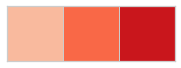

shallow -> middle -> deep


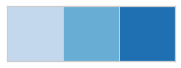

low -> average -> high


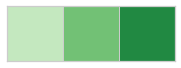

idea -> web


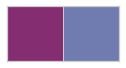

In [126]:
print(' -> '.join(difficulty))
sns.palplot(difficulty_palette.values())
plt.show()

print(' -> '.join(complexity))
sns.palplot(complexity_palette.values())
plt.show()

print(' -> '.join(level))
sns.palplot(level_palette.values())
plt.show()

print(' -> '.join(client))
sns.palplot(client_palette.values())
plt.show()

In [127]:
def merge_dfs(df_left: pd.DataFrame, df_right: pd.DataFrame, left_on: str, right_on: str) -> pd.DataFrame:
    df_merged = pd.merge(df_left, df_right, left_on=left_on, right_on=right_on, suffixes=('', '_extra'))
    df_merged.drop(df_merged.filter(regex='_extra$').columns.tolist(), axis=1, inplace=True)
    return df_merged

### Set path to following csv files (or use preset default)

In [177]:
users_file_path = '../data/java/users.csv'
steps_file_path = '../data/java/steps.csv'
topics_file_path = '../data/java/topics.csv'

submissions_file_path = '../data/java/prep_submissions_java11.csv'
submissions_stats_file_path = '../data/java/prep_submissions_stats_java11.csv'
client_stats_file_path = '../data/java/client_stats_java11.csv'

raw_issues_stats_file_path = '../data/java/raw_issues_stats_java11.csv'
raw_issues_classes_file_path = '../data/java/raw_issues_java11.csv'

qodana_issues_stats_file_path = '../data/java/qodana_issues_stats_java11.csv'
qodana_issues_classes_file_path = '../data/java/qodana_issues_java11.csv'


## Steps and Topics
**Step** - is a task where user is asked to write some code. Main attributes:
* **id** - *identifier of step*
* **seconds_to_complete** - *estimated secons to complete (calculated as average from all successful sumbissions)*
* **solved_by** - *number of successful sumbissions*
* **success_rate** - *number of successful sumbissions dvided by total number of sumbissions*
* **topic_id** - *id of topic step is related to*
* **complexity** - *[shallow, middle, deep] according to topic depth [d<=0.3, 0.3<d<0.6, d>=0.6]*
* **difficulty** - *[easy, medium, hard] according to success_rate [sr<=0.33, 0.33<sr<0.66, sr>=0.66]*

**Topic** - is a theme or knowledge area. Every step is related to some topic. Main attributes:
* **id** - *identifier of step*
* **prerequisites** - *topics ids which must be leared before*
* **depth** - *the depth in topics tree*

In [129]:
df_steps = pd.read_csv(steps_file_path)
df_steps.describe().astype('int32')

,id,topic,seconds_to_complete,solved_by,success_rate,depth,comment,hint,useful link,solutions,love,neutral,happy,angry,sad
count,415,415,415,415,415,415,415,415,415,415,415,415,415,415,415
mean,4473,235,366,5679,0,4,29,11,0,282,378,7,64,15,7
std,3415,347,283,8637,0,1,37,10,1,257,526,11,140,27,13
min,1926,1,46,72,0,0,0,0,0,5,7,0,0,0,0
25%,2325,42,172,1134,0,3,4,4,0,85,89,1,12,2,0
50%,2835,98,288,2462,0,4,14,8,0,179,182,3,24,5,3
75%,4940,186,459,7437,0,5,39,16,1,427,463,8,62,17,8
max,15239,1425,2356,82754,0,12,232,65,11,1191,5423,95,2129,215,131


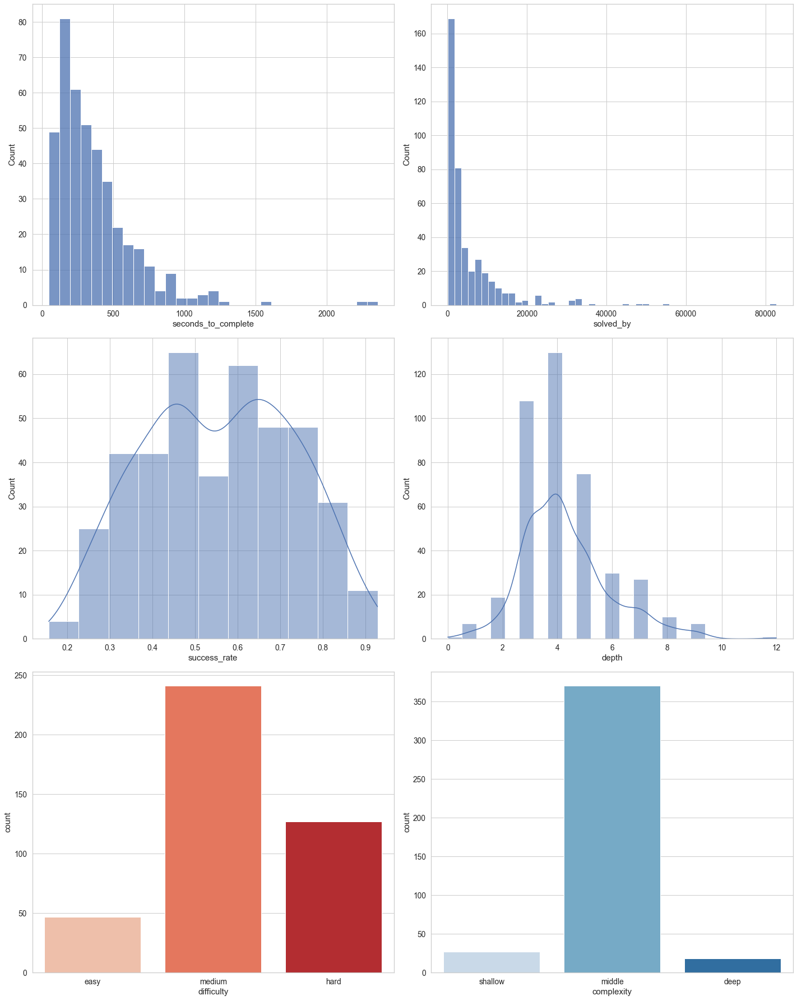

In [130]:
fig, ax = plt.subplots(figsize=((20, 25)), ncols=2, nrows=3)
sns.histplot(data=df_steps, x='seconds_to_complete', ax=ax[0][0])
sns.histplot(data=df_steps, x='solved_by', ax=ax[0][1])
sns.histplot(data=df_steps, x='success_rate', kde=True, ax=ax[1][0])
sns.histplot(data=df_steps, x='depth', kde=True, ax=ax[1][1])
sns.countplot(data=df_steps, x='difficulty', ax=ax[2][0], order=difficulty, palette=difficulty_palette)
sns.countplot(data=df_steps, x='complexity', ax=ax[2][1], order=complexity, palette=complexity_palette) 
fig.tight_layout()

Text(0.5, 1.0, 'Steps count groped by (difficuly, complexity)')

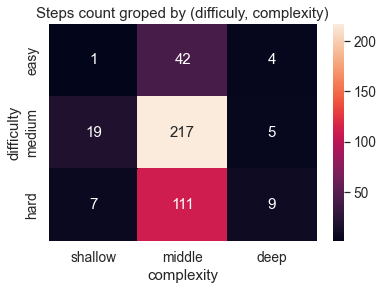

In [131]:
corr = df_steps.pivot_table('id', 'difficulty', 'complexity', aggfunc='count')
corr = corr.reindex(difficulty, axis=0)
corr = corr.reindex(complexity, axis=1)
sns.heatmap(corr, annot=True, fmt="d")
plt.title('Steps count groped by (difficuly, complexity)')

## Users

* **id** - *identifier of user*
* **passed_theories** - *number of passed theories steps*
* **passed_problems** - *number of passed problems*
* **passed_topics** - *number of passed topics*
* **passed_stages** - *number of passed stages*
* **passed_projects** - *number of passed projects*
* **hypercoins** - *number of collected hypercoins*
* **active_days** - *number of active days*
* **max_streak** - *max streak*
* **level** - *[low, avg, high] according to passed_topics [tp<=20, 20<tp<40, tp>=40]*

In [132]:
df_users = pd.read_csv(users_file_path)
df_users.describe().astype('int32')

,id,passed_theories,passed_problems,passed_topics,passed_stages,passed_projects,hypercoins,active_days,max_streak
count,37626,37626,37626,37626,37626,37626,37626,37626,37626
mean,19236,46,226,46,7,1,297,16,5
std,11815,74,446,75,18,3,634,36,14
min,0,0,0,0,0,0,0,0,0
25%,9486,7,14,3,0,0,27,2,1
50%,18978,16,60,16,2,1,140,4,2
75%,28480,53,233,56,7,1,293,16,5
max,82397,1143,8834,1155,525,109,28201,680,715


<AxesSubplot:xlabel='level', ylabel='count'>

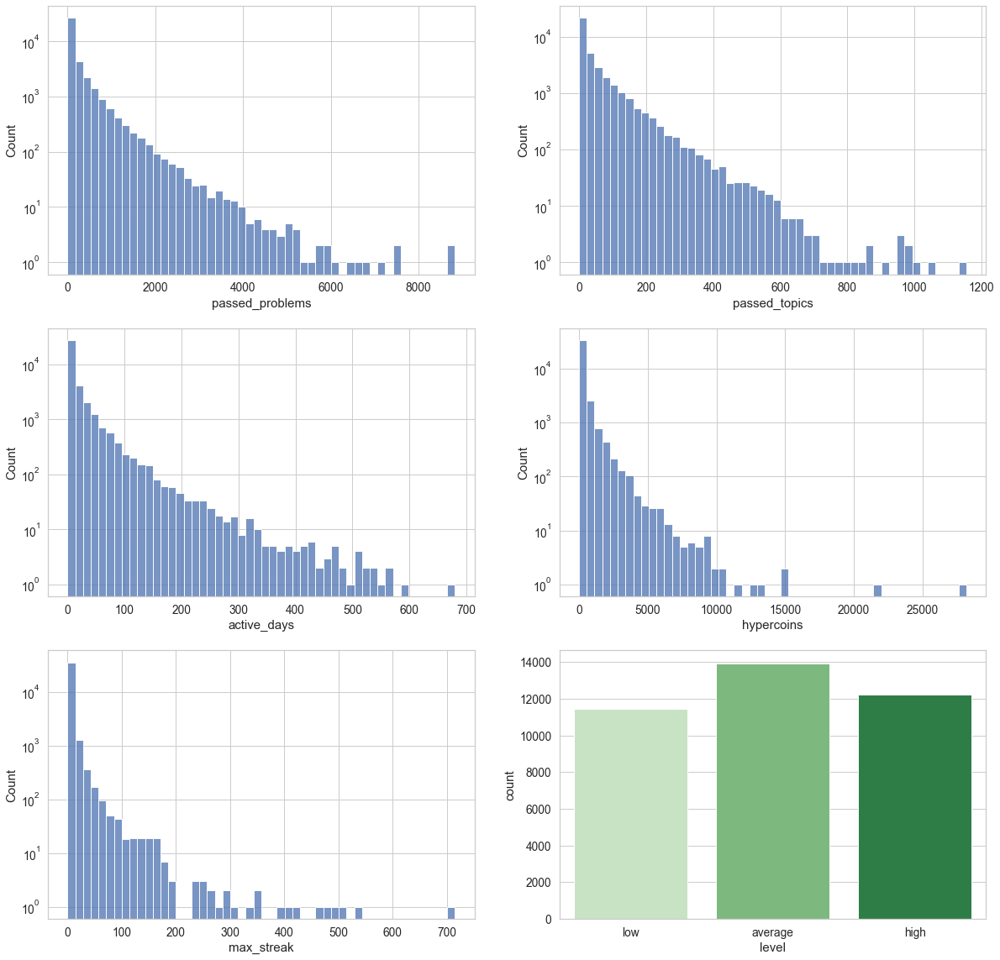

In [133]:
fig, ax = plt.subplots(figsize=((20, 20)), ncols=2, nrows=3)
sns.histplot(data=df_users, x='passed_problems', ax=ax[0][0], log_scale=(False, True), bins=50)
sns.histplot(data=df_users, x='passed_topics', ax=ax[0][1], log_scale=(False, True), bins=50)
sns.histplot(data=df_users, x='active_days', ax=ax[1][0], log_scale=(False, True), bins=50)
sns.histplot(data=df_users, x='hypercoins', ax=ax[1][1], log_scale=(False, True), bins=50)
sns.histplot(data=df_users, x='max_streak', ax=ax[2][0], log_scale=(False, True), bins=50)
sns.countplot(data=df_users, x='level', ax=ax[2][1], order=level, palette=level_palette)


## Submissions
Total number of submissions: 1459860\
Number of filtered submissions: 1411218 (without automatic resubmissions and suspicious submissions [too different from previous])

In [134]:
df_submissions = pd.read_csv(submissions_file_path)
df_submissions.describe().astype('int32')

,id,step_id,sync_counter,user_id,group,attempt,total_attempts
count,1073018,1073018,1073018,1073018,1073018,1073018,1073018
mean,42755199,3542,8,8454,548565,1,1
std,7919587,2391,1,7879,307715,0,1
min,29381342,1926,2,0,0,1,1
25%,35701302,2265,7,2284,272812,1,1
50%,42705906,2507,8,5888,573327,1,1
75%,49802164,3750,9,13032,820907,1,2
max,56397779,15239,22,82397,1055200,5,5


<AxesSubplot:xlabel='client', ylabel='Count'>

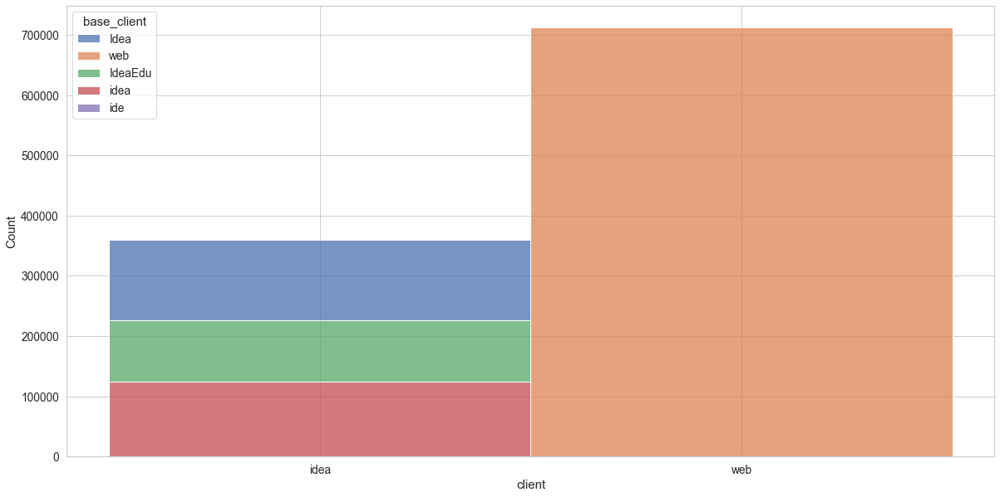

In [135]:
fig, ax = plt.subplots(figsize=((20, 10)))
sns.histplot(data=df_submissions, x='client', hue='base_client', multiple='stack')

## Submission statistics

In [136]:
df_submissions_stats = pd.read_csv(submissions_stats_file_path)
df_submissions_stats = df_submissions_stats[df_submissions_stats['id'].isin(df_submissions['id'])]

In [137]:
df_submissions_stats = merge_dfs(df_submissions_stats, df_submissions, left_on='id', right_on='id')
df_submissions_stats = merge_dfs(df_submissions_stats, df_steps[['id', 'complexity', 'difficulty']], left_on='step_id', right_on='id')
df_submissions_stats = merge_dfs(df_submissions_stats, df_users[['id', 'level']], left_on='user_id', right_on='id')

In [138]:
df_submissions_stats['raw_issues_by_code_lines'] = df_submissions_stats['raw_issues_count'] / df_submissions_stats['code_lines_count']
df_submissions_stats['qodana_issues_by_code_lines'] = df_submissions_stats['qodana_issues_count'] / df_submissions_stats['code_lines_count']


<AxesSubplot:xlabel='level', ylabel='count'>

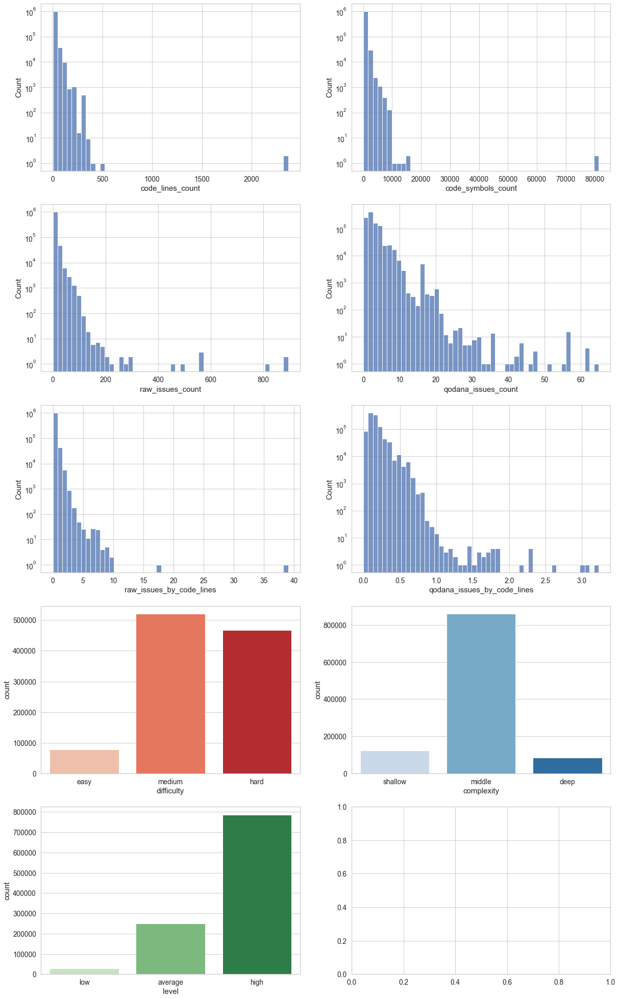

In [139]:
fig, ax = plt.subplots(figsize=((20, 35)), ncols=2, nrows=5)
sns.histplot(data=df_submissions_stats, x='code_lines_count', ax=ax[0][0], log_scale=(False, True), bins=50)
sns.histplot(data=df_submissions_stats, x='code_symbols_count', ax=ax[0][1], log_scale=(False, True), bins=50)
sns.histplot(data=df_submissions_stats, x='raw_issues_count', ax=ax[1][0], log_scale=(False, True), bins=50)
sns.histplot(data=df_submissions_stats, x='qodana_issues_count', ax=ax[1][1], log_scale=(False, True), bins=50)

sns.histplot(data=df_submissions_stats, x='raw_issues_by_code_lines', ax=ax[2][0], log_scale=(False, True), bins=50)
sns.histplot(data=df_submissions_stats, x='qodana_issues_by_code_lines', ax=ax[2][1], log_scale=(False, True), bins=50)

sns.countplot(data=df_submissions_stats, x='difficulty', ax=ax[3][0], order=difficulty, palette=difficulty_palette)
sns.countplot(data=df_submissions_stats, x='complexity', ax=ax[3][1], order=complexity, palette=complexity_palette)
sns.countplot(data=df_submissions_stats, x='level', ax=ax[4][0], order=level, palette=level_palette)


In [140]:
def draw_heatmap_compare(df, attr_pairs, features):
    fig, ax = plt.subplots(figsize=((20, 6 * len(attr_pairs))), 
                           ncols=len(features), nrows=len(attr_pairs), constrained_layout=True)
    sns.set_theme(style='whitegrid', font_scale=2)
    for i, attr_pair in enumerate(attr_pairs):

        attr0, attr1 = attr_pair
        (attr0, values0) = attr0
        (attr1, values1) = attr1
        for j, feature in enumerate(features):
            axij =  ax[j] if len(attr_pairs) == 1 else ax[i][j]

            if feature == 'id':
                corr = df.pivot_table(feature, attr0, attr1, aggfunc='count')
                axij.set_title('Submissions count') 
                fmt = 'd'
            else:
                corr = df.pivot_table(feature, attr0, attr1, aggfunc=np.mean)
                axij.set_title(f'Avg {feature}') 
                fmt = '.2f'
                
            corr = corr.reindex(values0, axis=0)
            corr = corr.reindex(values1, axis=1)
            sns.heatmap(corr, annot=True, fmt=fmt, ax=axij, linewidths=.5, cmap=sns.color_palette('flare'))

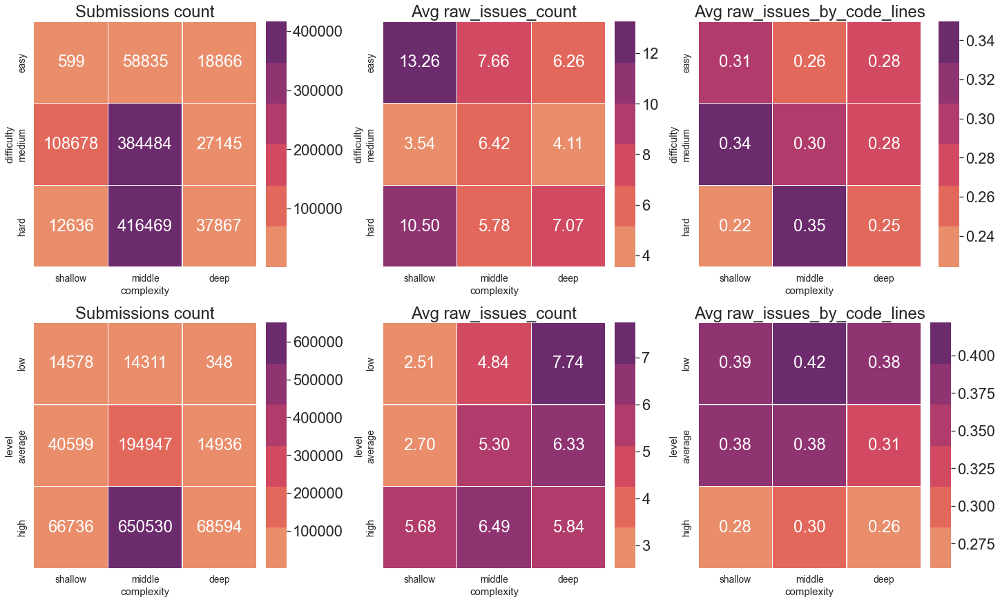

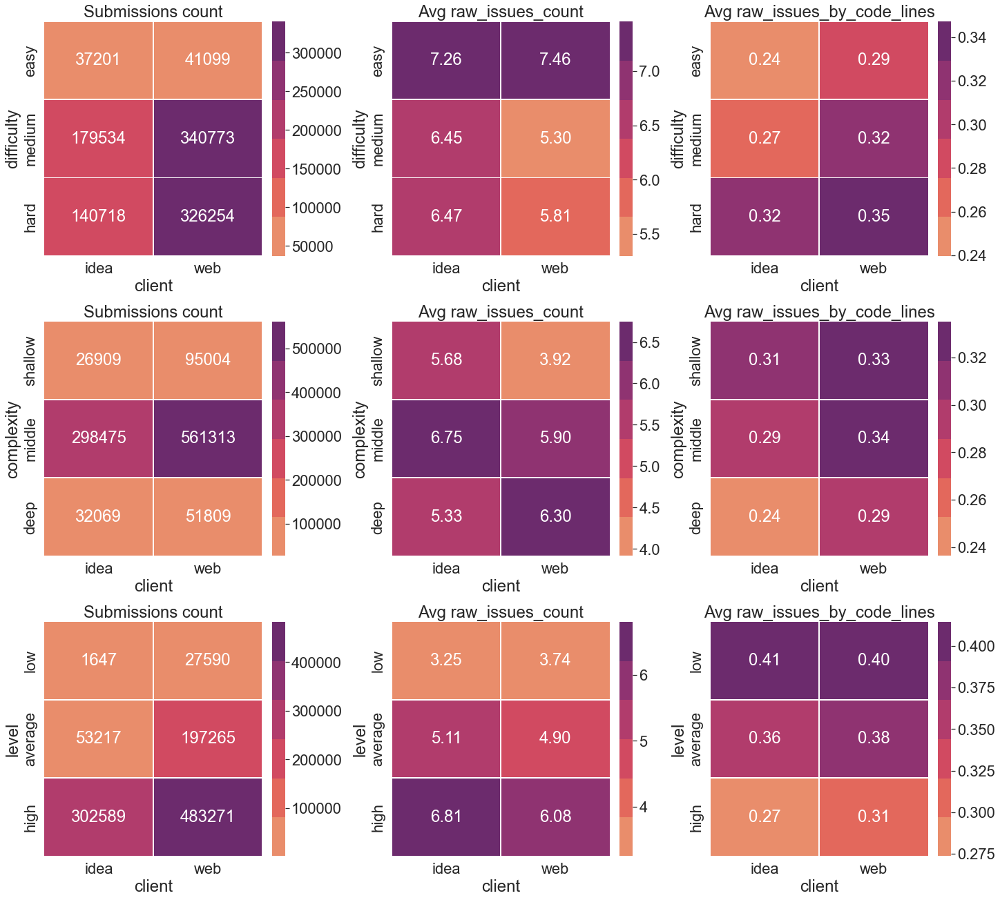

In [141]:
draw_heatmap_compare(df_submissions_stats, 
                     [(('difficulty', difficulty), ('complexity', complexity)), 
                      (('level', level), ('complexity', complexity))],
                     ['id', 'raw_issues_count', 'raw_issues_by_code_lines'])
draw_heatmap_compare(df_submissions_stats,
                     [(('difficulty', difficulty), ('client', client)), 
                      (('complexity', complexity), ('client', client)),
                      (('level', level), ('client', client))],
                     ['id', 'raw_issues_count', 'raw_issues_by_code_lines'])

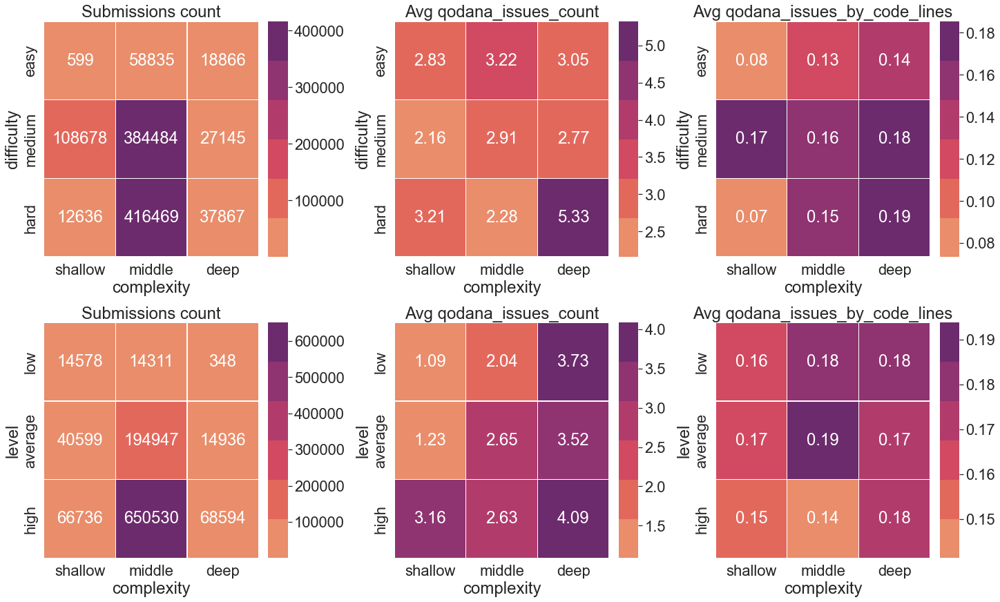

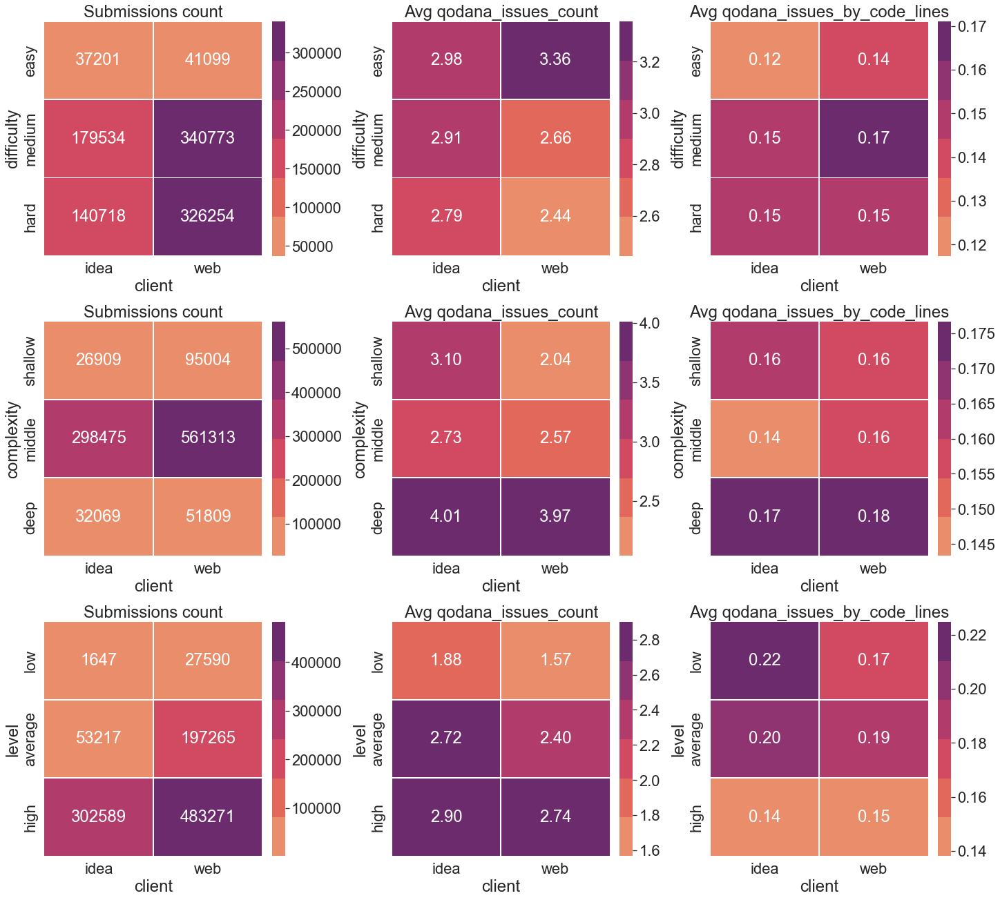

In [142]:
draw_heatmap_compare(df_submissions_stats, 
                     [(('difficulty', difficulty), ('complexity', complexity)), 
                      (('level', level), ('complexity', complexity))],
                     ['id', 'qodana_issues_count', 'qodana_issues_by_code_lines'])
draw_heatmap_compare(df_submissions_stats,
                     [(('difficulty', difficulty), ('client', client)), 
                      (('complexity', complexity), ('client', client)),
                      (('level', level), ('client', client))],
                     ['id', 'qodana_issues_count', 'qodana_issues_by_code_lines'])

In [143]:
def draw_compare(df, feature: str, attrs, bins: List[int]):
    sns.set_theme(style='whitegrid', font_scale=2, rc={"lines.linewidth": 5, "lines.markersize": 15})
    for attr, values, palette in attrs:
        fig, ax = plt.subplots(figsize=((20, 10)), constrained_layout=True)
        ax.set_xlabel(feature)
        ax.set_ylabel('% submission')
        for v in values:
            df_v = df[df[attr] == v]
            intervals = pd.cut(df_v[feature], bins=bins)
            counts = df_v.groupby(intervals).count()['id'] / df_v.shape[0]
            sns.lineplot(x=bins[:-1], y=counts, ax=ax, label=v, marker='o', color=palette[v])
        ax.set_title(f'Submissions % distributions by {attr}')
        plt.show()

In [144]:
attrs = [('complexity', complexity, complexity_palette), 
         ('difficulty', difficulty, difficulty_palette),
         ('level', level, level_palette),
         ('client', client, client_palette)]

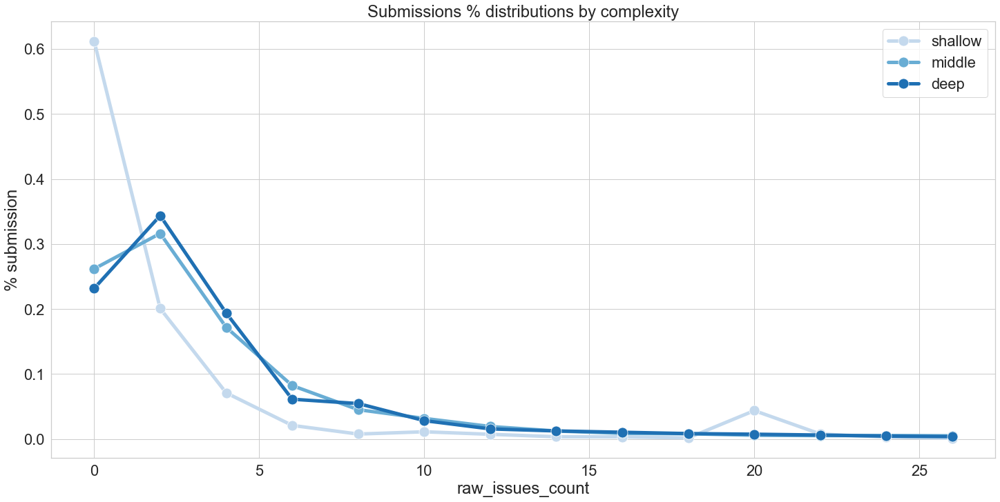

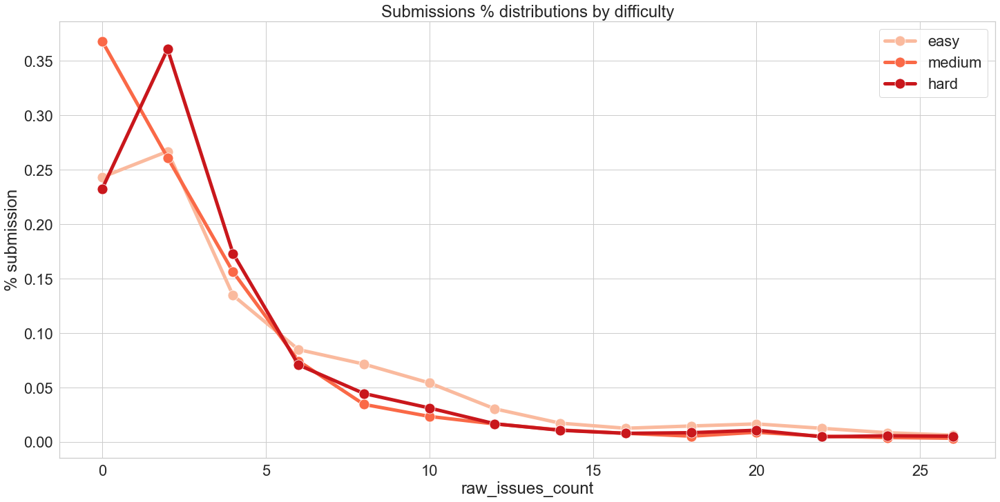

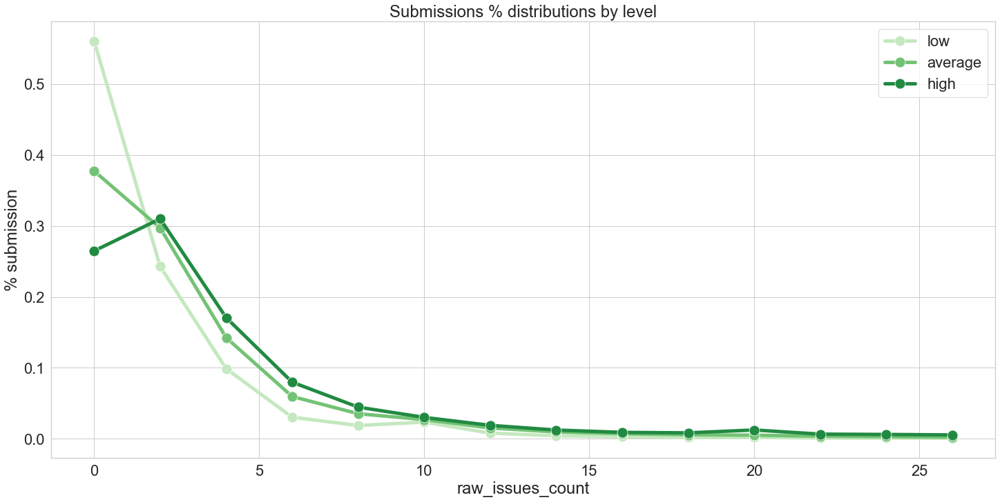

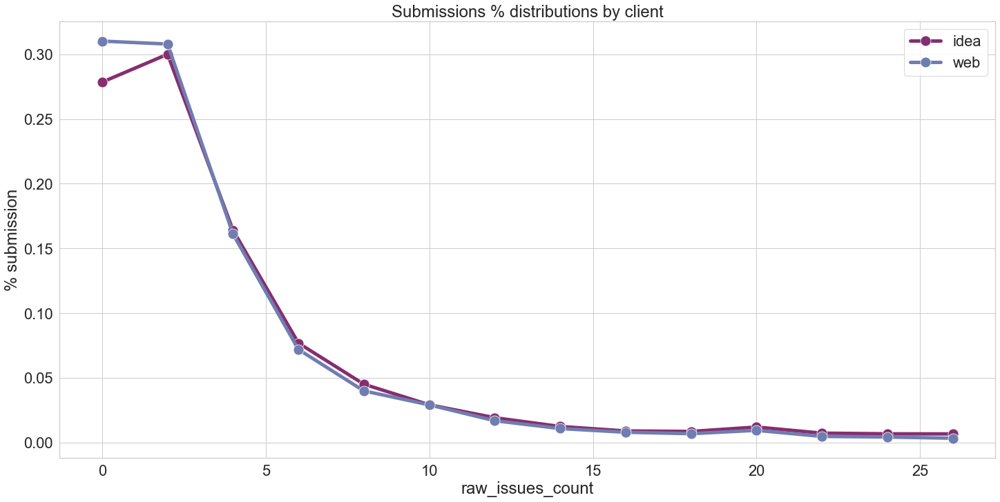

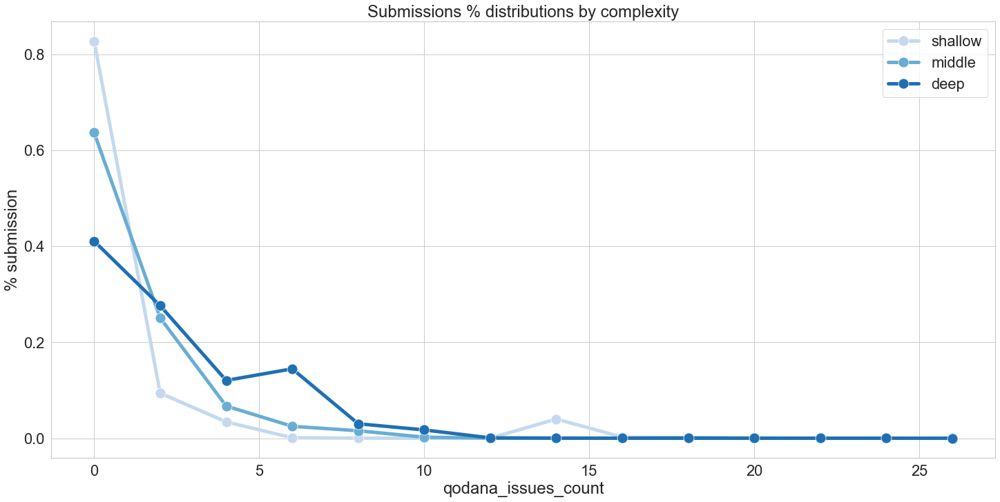

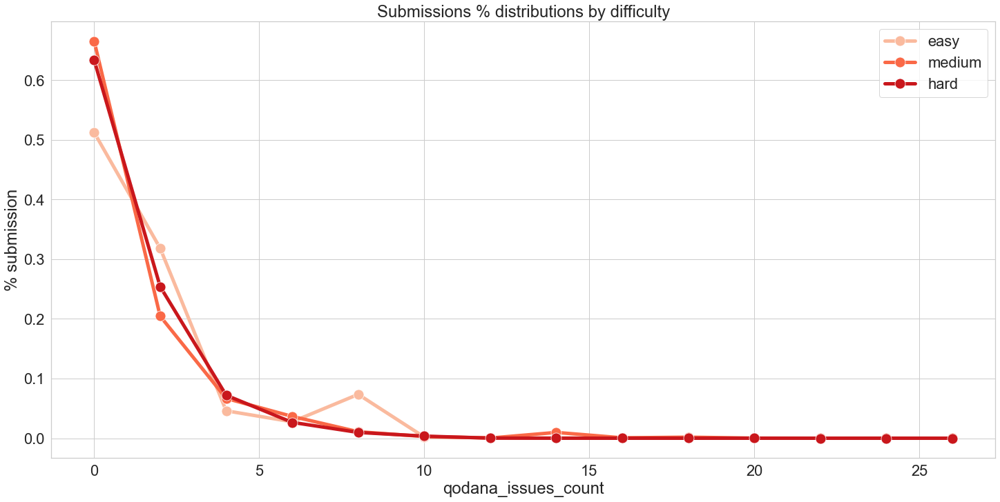

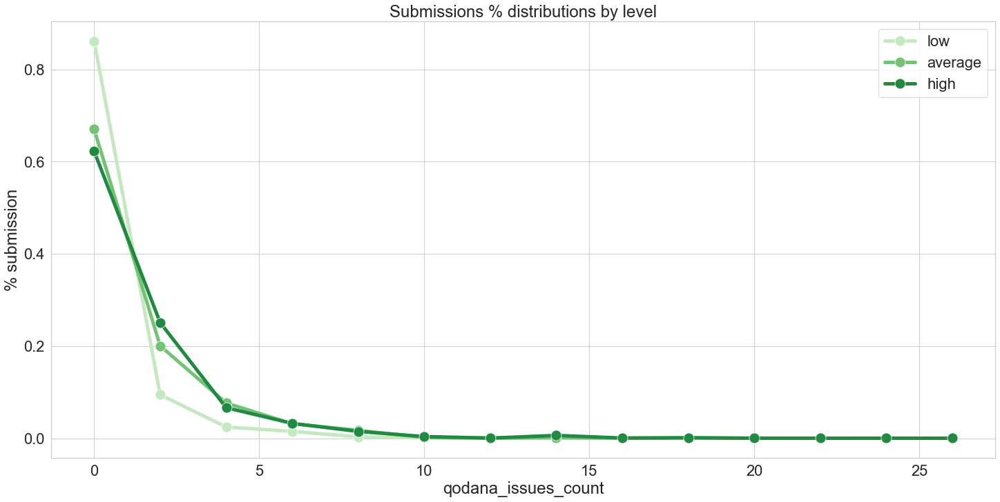

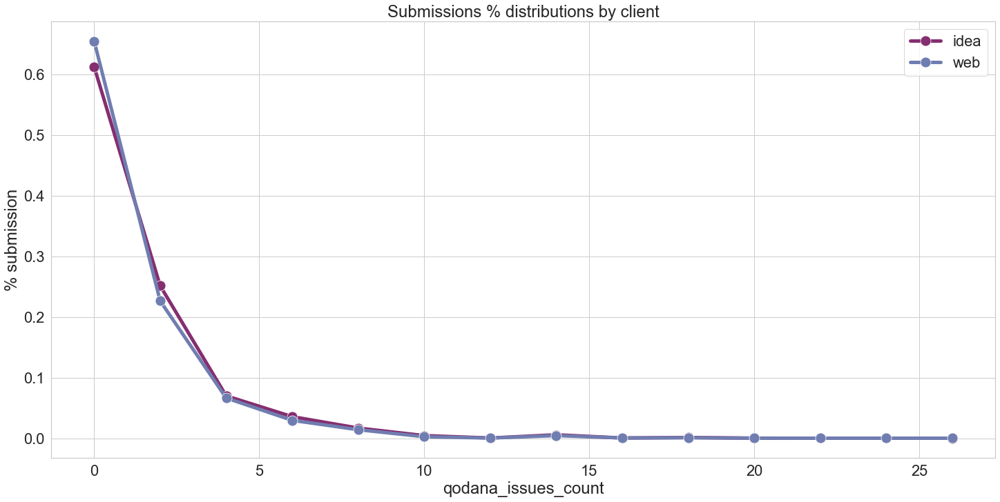

In [145]:
draw_compare(df_submissions_stats, 'raw_issues_count', attrs, range(0, 30, 2))
draw_compare(df_submissions_stats, 'qodana_issues_count', attrs, range(0, 30, 2))

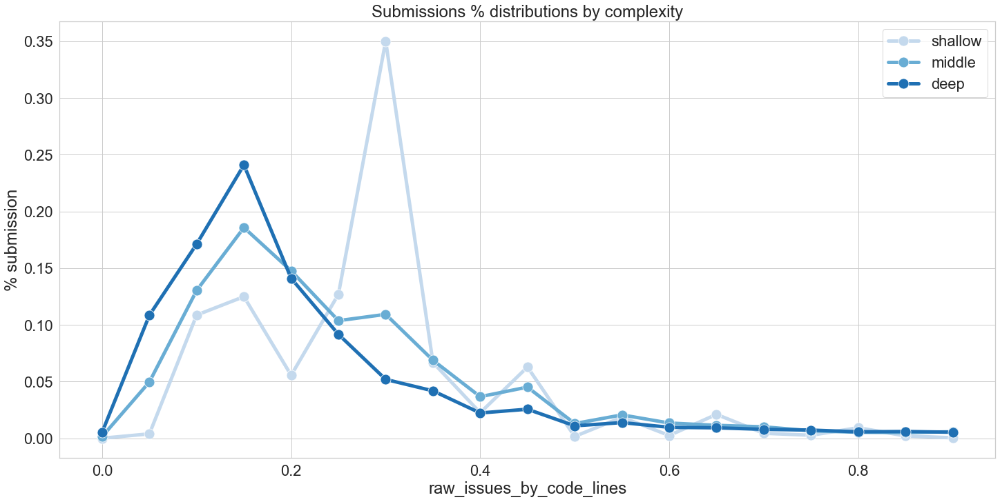

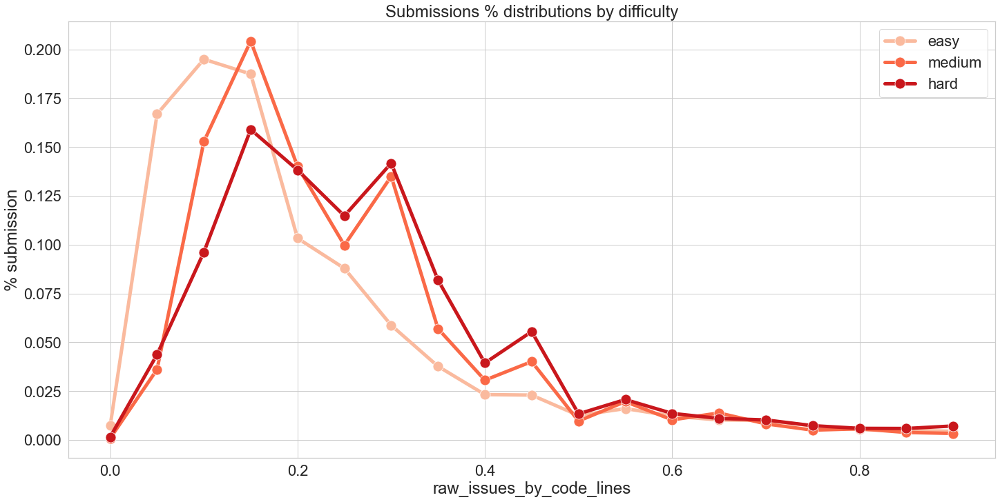

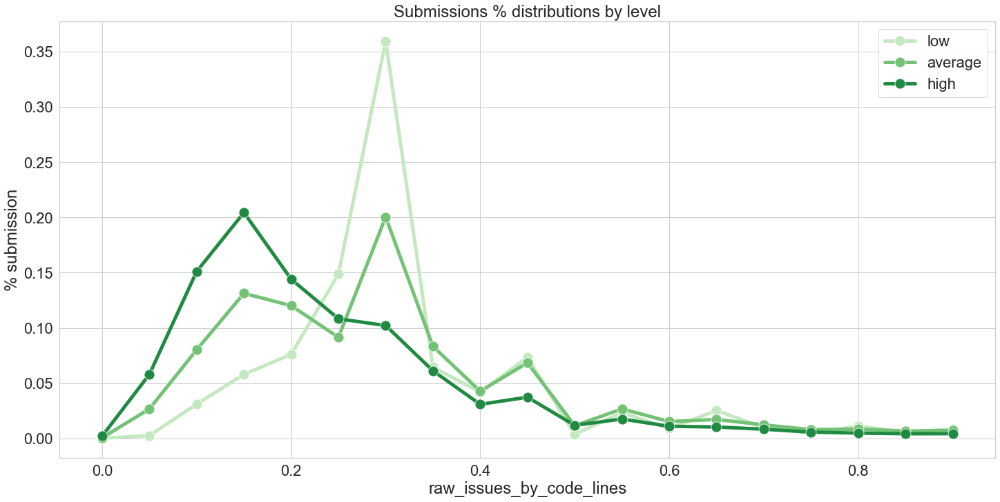

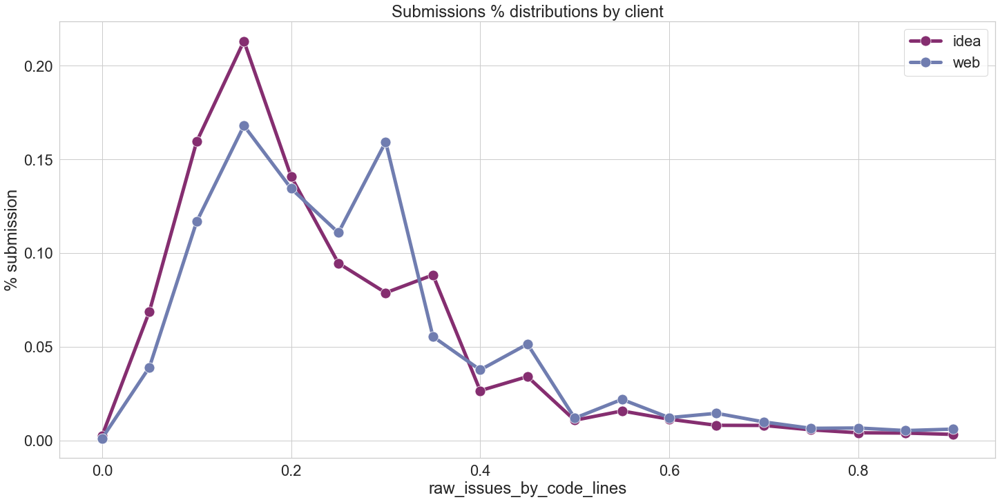

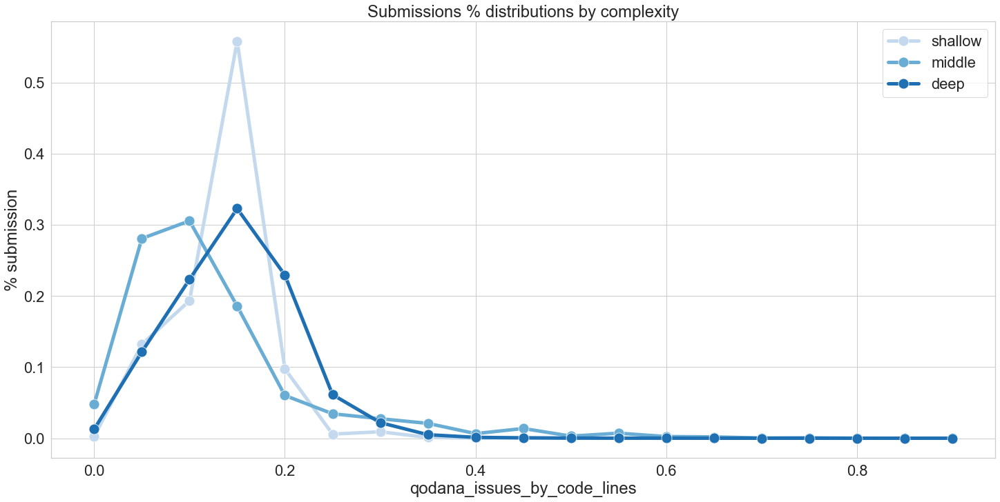

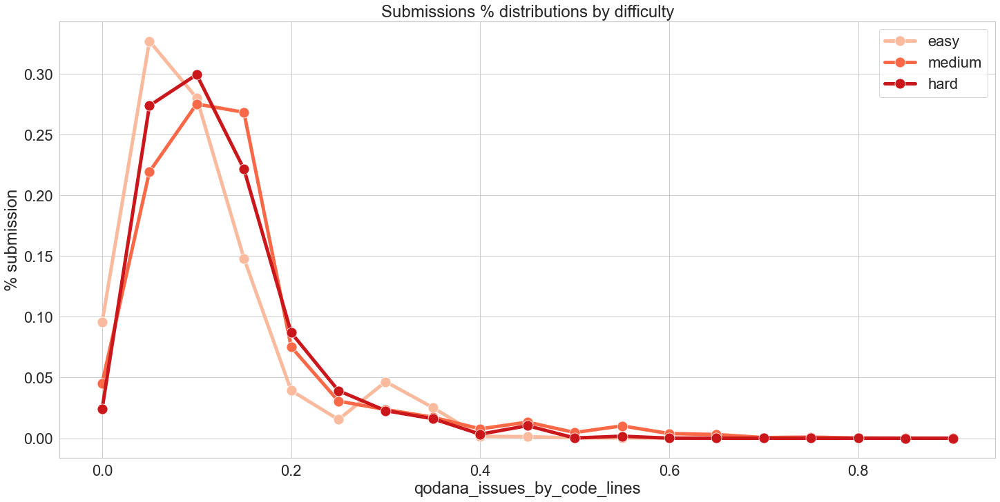

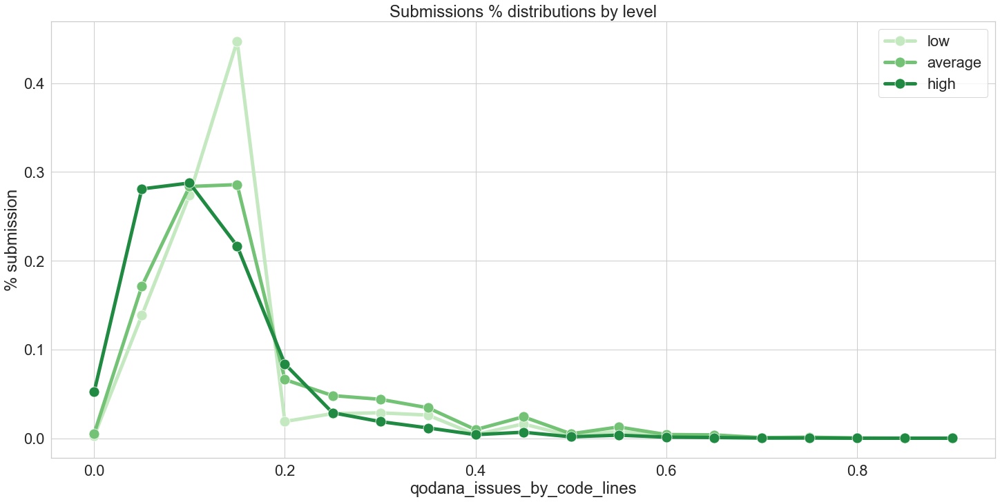

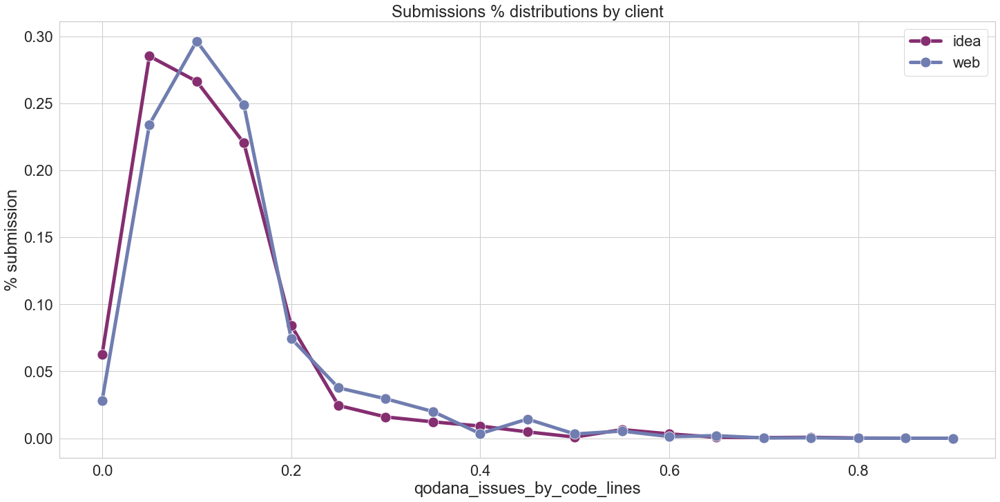

In [146]:
draw_compare(df_submissions_stats, 'raw_issues_by_code_lines', attrs, np.arange(0, 1, 0.05))
draw_compare(df_submissions_stats, 'qodana_issues_by_code_lines', attrs, np.arange(0, 1, 0.05))

## Issues

In [147]:
def get_issues_stats(df: pd.DataFrame, issues: Dict[str, str], attr: str, 
                     by_type: bool = False, percent: bool = True, 
                     by_code_rows: bool = False, unique: bool = False) -> pd.DataFrame:
    
    issues_stats = {'issue': [], 'count': [], attr: []}
    for v in df[attr].unique():
        df_v = df[df[attr] == v]
        for issue_class, issue_type in issues.items():
            issues_stats['issue'].append(issue_type if by_type else issue_class)
            if by_code_rows:
                issues_stats['count'].append((df_v[issue_class] / df_v['code_rows_count']).sum())
            elif unique:
                issues_stats['count'].append((df_v[issue_class].apply(lambda x: min(x, 1))).sum())
            else:
                issues_stats['count'].append(df_v[issue_class].sum())
            issues_stats[attr].append(v)
    df_stats = pd.DataFrame.from_dict(issues_stats)
    df_stats = df_stats.groupby(['issue', attr], as_index=False).sum()
    
    if percent:
        count = {}
        for v in df[attr].unique():
            count[v] = df_stats[df_stats[attr] == v]['count'].sum()
        df_stats['count'] = df_stats.apply(lambda x: 0 if count[x[attr]] == 0 else x['count'] / count[x[attr]], axis=1)
    return df_stats
    

In [148]:
def draw_compare_issues(df: pd.DataFrame, attrs, issues: Dict[str, str], 
                        by_type: bool = False, percent: bool = True, by_code_rows: bool = False, n: int=20):
    
    n_issues = sorted(issues.keys(), key=lambda issue: -df[issue].sum())[:n]
    
    for attr, values, palette in attrs:
        sns.set_theme(style='whitegrid', font_scale=2, rc={"lines.linewidth": 5, "lines.markersize": 15})

        stats = get_issues_stats(df.dropna(subset=[attr]), issues, attr, by_type, percent, by_code_rows)
        if not by_type:
            stats = stats[stats['issue'].isin(n_issues)]
        
        if by_type:
            stats.sort_values(by='count', inplace=True, ascending=False)
        else:
            stats.sort_values(by='issue', inplace=True, key=lambda s: [n_issues.index(issue) for issue in s])

        stats.to_csv(f'new_{attr}.csv', index=False)
        
        fig, ax = plt.subplots(figsize=((20, 10)), constrained_layout=True)
        ax.set_xlabel('issues')
        if by_code_rows:
            ax.set_ylabel('Averege issues by code rows' if percent else 'Total issues by code rows')
        else:
            ax.set_ylabel('Percent of submissions with issue\n' if percent else 'Total number of issues\n in submissions')
        if not percent:
            ax.set_yscale('log')
        
        sns.lineplot(data=stats, x='issue', y='count', hue=attr, hue_order=values, ax=ax, palette=palette, marker='o')
    
        plt.xticks(rotation=45, ha="right",rotation_mode='anchor')
        for tick, issue in zip(ax.xaxis.get_ticklabels(), stats['issue'].unique()): 
            if (by_type and issue == 'INFO') or ((not by_type) and issues[issue] == 'INFO'):
                tick.set_color('grey')
            else:
                tick.set_color('black')
            
        plt.show()

In [149]:
def get_issues_change_stats(df_all: pd.DataFrame, df_change_all: pd.DataFrame, attr, values, top_issues: List[str]):

    result = {
        attr: [],
        'issue': [],
        'made': [],
        'solved': [],
        'clean': []
    }
    
    for value in values:
        df = df_all[df_all[attr] == value]
        df_change = df_change_all[df_change_all[attr] == value]
        
        for issue in top_issues:
            clean_ids = df[df[issue] == 0]['id'].values

            result[attr].append(value)
            result['issue'].append(issue)
            result['made'].append(df_change[df_change[issue] > 0][issue].mean())
            result['solved'].append(df_change[df_change[issue] < 0][issue].mean())
            df_clean = df_change[(df_change[issue] == 0) & (df_change['id'].isin(clean_ids))]
            result['clean'].append(df_clean.shape[0] / df_change.shape[0])

    return pd.DataFrame.from_dict(result)
            


def draw_compare_issues_change(df: pd.DataFrame, df_change: pd.DataFrame, attrs, issues: Dict[str, str], top_issues: List[str]):
    
    for attr, values, palette in attrs:
        sns.set_theme(style='whitegrid', font_scale=2, rc={"lines.linewidth": 5, "lines.markersize": 15})
            
        stats = get_issues_change_stats(df, df_change, attr, values, top_issues)
        
        stats.to_csv(f'issue_change_{attr}.csv', index=False)
                
        for change in ['made', 'solved', 'clean']:
            
            fig, ax = plt.subplots(figsize=((20, 10)), constrained_layout=True)
            ax.set_ylabel(f'Averege number of issues {change}' if change != 'clean' else f'Percent of clean solutions')

            sns.lineplot(data=stats, x='issue', y=change, hue=attr, hue_order=values, ax=ax, palette=palette, marker='o')

            plt.xticks(rotation=45, ha="right",rotation_mode='anchor')
            for tick, issue in zip(ax.xaxis.get_ticklabels(), top_issues): 
                if issues[issue] == 'INFO':
                    tick.set_color('grey')
                else:
                    tick.set_color('black')

            plt.show()

## Raw issue

In [150]:
df_raw_issues_stats = pd.read_csv(raw_issues_stats_file_path)
df_raw_issues_stats = df_raw_issues_stats[df_raw_issues_stats['id'].isin(df_submissions['id'])]
df_raw_issues_stats.describe()

,id,CyclomaticComplexityCheck,JavaNCSSCheck,MagicNumberCheck,BooleanExpressionComplexityCheck,UnusedPrivateField,SingularField,LocalVariableNameCheck,NoWhitespaceAfterCheck,UnnecessaryLocalBeforeReturn,...,NonCaseLabelInSwitchStatement,EmptyStatementBlock,MissingOverride,ClassCastExceptionWithToArray,BooleanGetMethodName,DoubleCheckedLocking,AvoidProtectedFieldInFinalClass,CovariantEqualsCheck,AvoidThrowingNewInstanceOfSameException,AvoidMultipleUnaryOperators
count,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,...,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1073018.0,1073018.0,1073018.0,1.073018e+06,1.073018e+06
mean,4.275520e+07,1.550096e+00,1.550096e+00,6.793884e-01,1.627894e-01,1.145368e-03,7.418328e-04,3.455674e-02,1.016572e-02,2.630897e-03,...,1.863902e-06,6.523656e-06,9.319508e-07,9.319508e-07,1.863902e-06,0.0,0.0,0.0,9.319508e-07,9.319508e-07
std,7.919588e+06,2.286060e+00,2.286060e+00,1.444437e+00,5.247499e-01,4.691364e-02,3.070154e-02,3.451010e-01,1.351152e-01,5.694553e-02,...,1.365247e-03,3.738881e-03,9.653760e-04,9.653760e-04,1.365247e-03,0.0,0.0,0.0,9.653760e-04,9.653760e-04
min,2.938134e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.000000e+00
25%,3.570130e+07,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.000000e+00
50%,4.270591e+07,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.000000e+00
75%,4.980216e+07,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.000000e+00
max,5.639778e+07,2.500000e+02,2.500000e+02,2.890000e+02,5.600000e+01,8.000000e+00,4.000000e+00,1.200000e+01,1.400000e+01,8.000000e+00,...,1.000000e+00,3.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.0,0.0,0.0,1.000000e+00,1.000000e+00


In [151]:
df_raw_issues_stats = merge_dfs(df_raw_issues_stats, df_submissions_stats, left_on='id', right_on='id')

In [152]:
df_raw_issues_classes = pd.read_csv(raw_issues_classes_file_path)
raw_issues = {r['class']: r['type'] for i, r in df_raw_issues_classes.iterrows()}
raw_issues.pop('CyclomaticComplexityCheck')
raw_issues.pop('JavaNCSSCheck')

'FUNC_LEN'

In [153]:
df_raw_issues_stats_unique = df_raw_issues_stats.copy()
for issue_class, issue_type in raw_issues.items():
    df_raw_issues_stats_unique[issue_class] = df_raw_issues_stats_unique[issue_class].apply(lambda x: min(x, 1))

In [154]:
df_raw_issues_stats = df_raw_issues_stats.drop(['CyclomaticComplexityCheck', 'JavaNCSSCheck'], axis=1)
df_raw_issues_stats_unique = df_raw_issues_stats_unique.drop(['CyclomaticComplexityCheck', 'JavaNCSSCheck'], axis=1)


# Qodana issues

In [155]:
df_qodana_issues_stats = pd.read_csv(qodana_issues_stats_file_path)
df_qodana_issues_stats = df_qodana_issues_stats[df_qodana_issues_stats['id'].isin(df_submissions['id'])]
df_qodana_issues_stats.describe()

,id,SystemOutErr,JavaAnnotator,WrongPackageStatement,IOResource,ConstantConditions,AssignmentToStaticFieldFromInstanceMethod,UnusedAssignment,CommentedOutCode,ReplaceAssignmentWithOperatorAssignment,...,ExtendsObject,InvalidComparatorMethodReference,MethodOverloadsParentMethod,MisspelledEquals,MultipleVariablesInDeclaration,NewStringBufferWithCharArgument,NonSynchronizedMethodOverridesSynchronizedMethod,OptionalAssignedToNull,RedundantUnmodifiable,StringEqualsCharSequence
count,1.073018e+06,1.073018e+06,1073018.0,1073018.0,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,1.073018e+06,...,1073018.0,1073018.0,1073018.0,1.073018e+06,1073018.0,1073018.0,1073018.0,1073018.0,1.073018e+06,1073018.0
mean,4.275520e+07,1.752140e+00,0.0,0.0,6.292196e-01,4.189864e-02,3.990520e-02,2.927910e-02,2.812068e-02,2.249543e-02,...,0.0,0.0,0.0,9.319508e-07,0.0,0.0,0.0,0.0,9.319508e-07,0.0
std,7.919588e+06,1.606760e+00,0.0,0.0,4.846185e-01,3.157184e-01,5.631433e-01,2.227430e-01,2.005045e-01,1.978410e-01,...,0.0,0.0,0.0,9.653760e-04,0.0,0.0,0.0,0.0,9.653760e-04,0.0
min,2.938134e+07,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.000000e+00,0.0
25%,3.570130e+07,1.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.000000e+00,0.0
50%,4.270591e+07,1.000000e+00,0.0,0.0,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.000000e+00,0.0
75%,4.980216e+07,2.000000e+00,0.0,0.0,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.000000e+00,0.0
max,5.639778e+07,6.400000e+01,0.0,0.0,7.000000e+00,3.600000e+01,9.000000e+00,1.900000e+01,8.000000e+00,1.400000e+01,...,0.0,0.0,0.0,1.000000e+00,0.0,0.0,0.0,0.0,1.000000e+00,0.0


In [156]:
df_qodana_issues_stats = merge_dfs(df_qodana_issues_stats, df_submissions_stats, left_on='id', right_on='id')

In [157]:
df_qodana_issues_classes = pd.read_csv(qodana_issues_classes_file_path)
qodana_issues = {r['class']: r['type'] for i, r in df_qodana_issues_classes.iterrows()}
qodana_issues.pop('SystemOutErr')
qodana_issues.pop('IOResource')

'ERROR_PRONE'

In [158]:
df_qodana_issues_stats_unique = df_qodana_issues_stats.copy()
for issue_class, issue_type in qodana_issues.items():
    df_qodana_issues_stats_unique[issue_class] = df_qodana_issues_stats_unique[issue_class].apply(lambda x: min(x, 1))

In [159]:
df_qodana_issues_stats = df_qodana_issues_stats.drop(['SystemOutErr', 'IOResource'], axis=1)
df_qodana_issues_stats_unique = df_qodana_issues_stats_unique.drop(['SystemOutErr', 'IOResource'], axis=1)


## Percent of submissions with each issue class (all submissions)

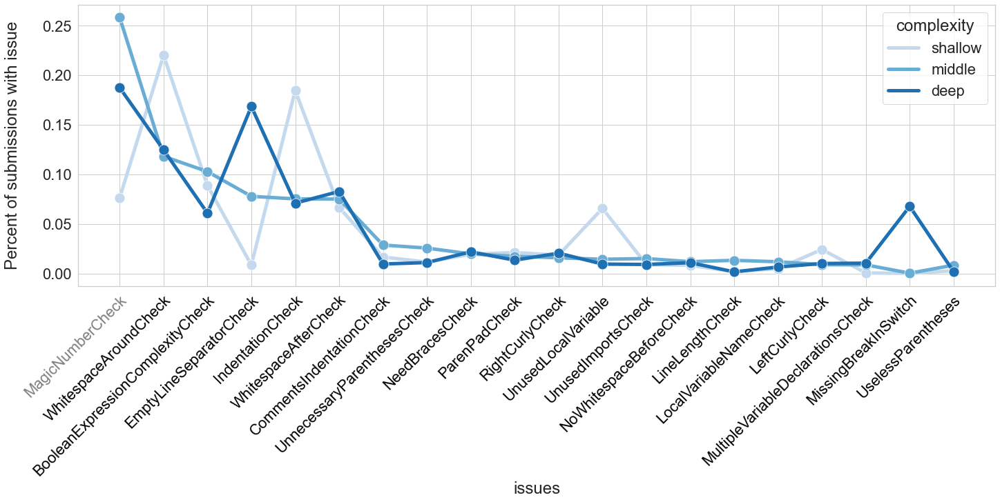

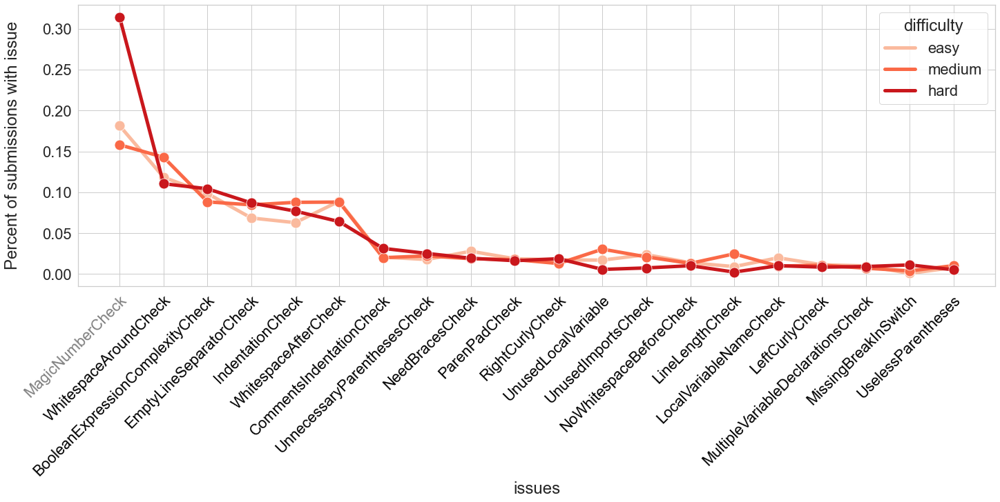

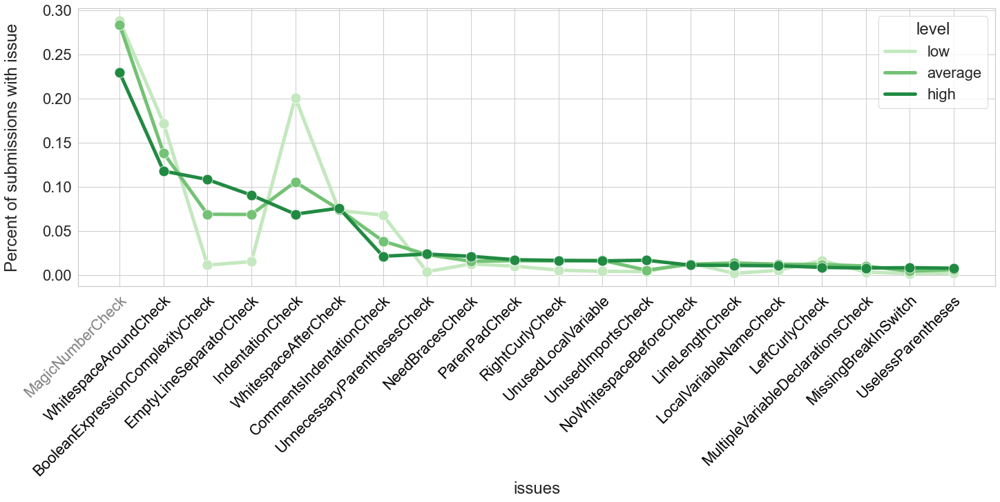

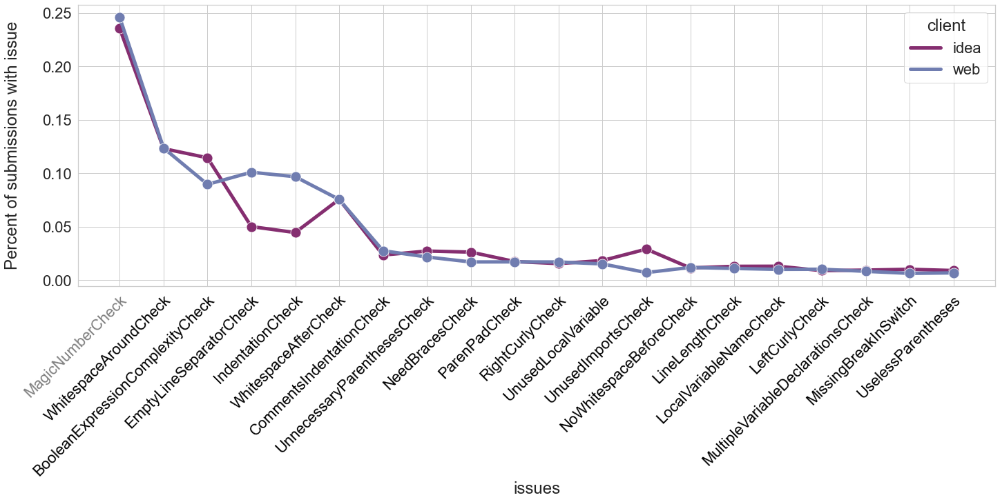

In [160]:
draw_compare_issues(df_raw_issues_stats_unique, attrs, raw_issues, by_type=False, percent=True, by_code_rows=False)
# draw_compare_issues(df_raw_issues_stats_unique, attrs, raw_issues, by_type=True, percent=True, by_code_rows=False)

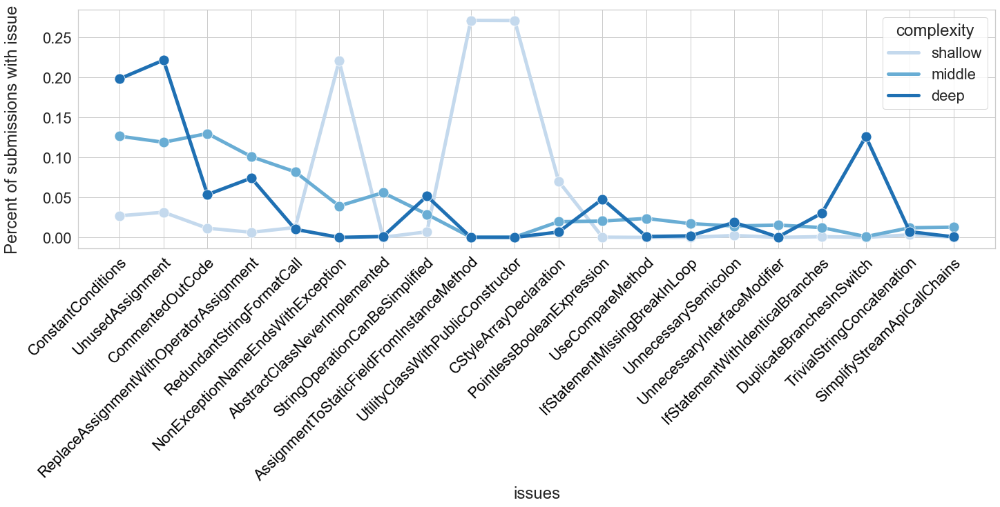

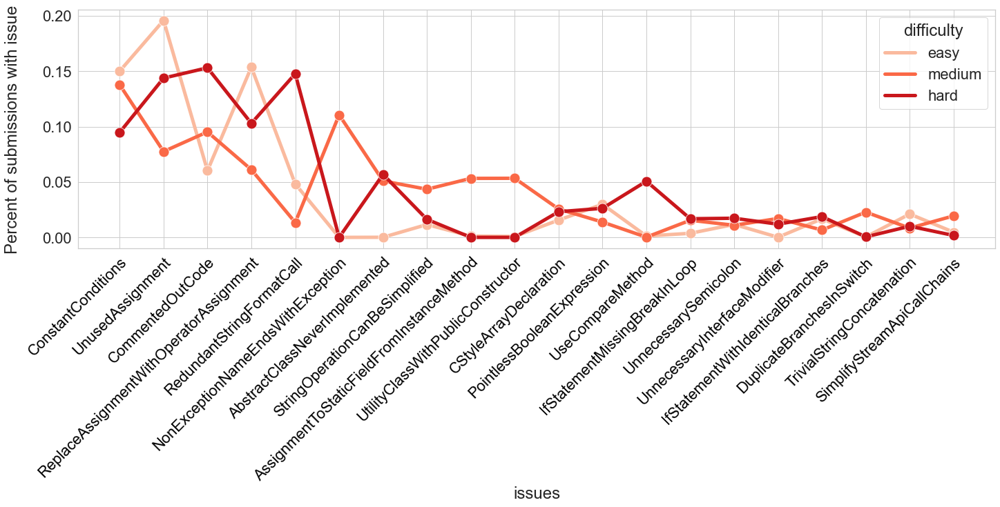

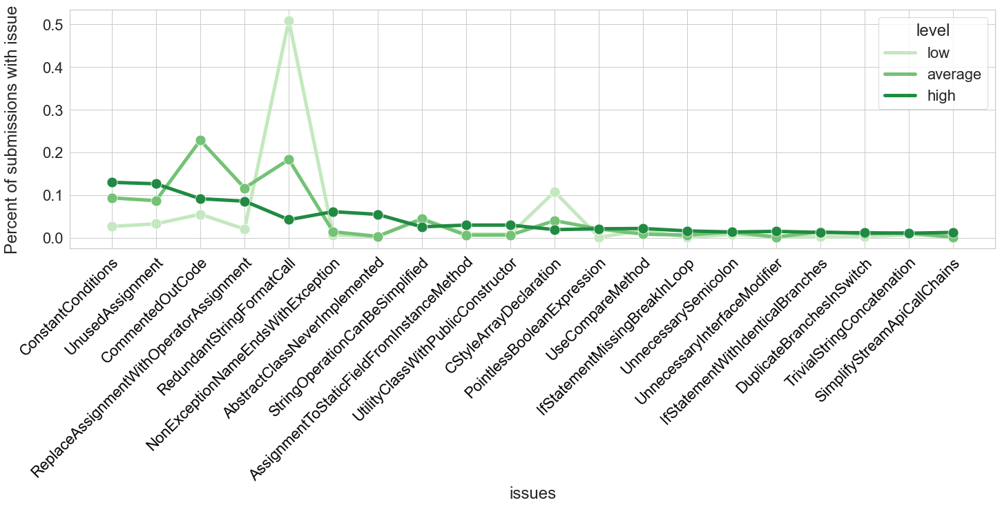

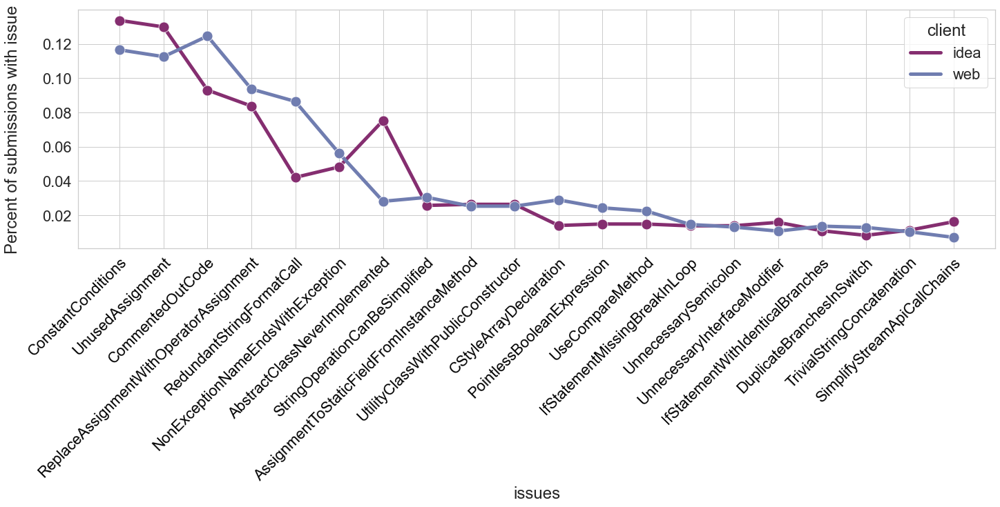

In [161]:
draw_compare_issues(df_qodana_issues_stats_unique, attrs, qodana_issues, by_type=False, percent=True, by_code_rows=False)
# draw_compare_issues(df_qodana_issues_stats_unique, attrs, qodana_issues, by_type=True, percent=True, by_code_rows=False)

# First attempt stats
All submissions was grouped by (user_id, step_id) and have 
* **group** - number of group and 
* **attempt** - attempt inside group
* **total_attemps** - total number of attemps in group of submissions (size of group)

First attempt submissions is when **attempt** == 1

In [162]:
df_first_attempt_stats = df_submissions_stats[df_submissions_stats['attempt'] == 1]
df_first_attempt_stats.describe()

,id,code_lines_count,code_symbols_count,qodana_issues_count,raw_issues_count,step_id,sync_counter,user_id,group,attempt,total_attempts,raw_issues_by_code_lines,qodana_issues_by_code_lines
count,8.285600e+05,828560.000000,828560.000000,828560.000000,828560.000000,828560.000000,828560.000000,828560.000000,8.285600e+05,828560.0,828560.000000,828560.000000,828560.000000
mean,4.273618e+07,20.047659,517.732251,2.678321,6.087323,3566.038964,8.394803,8588.296581,5.519064e+05,1.0,1.286061,0.323572,0.159999
std,7.900165e+06,19.588604,514.414312,2.112141,8.014584,2402.889875,1.627171,8039.852387,3.084101e+05,0.0,0.674301,0.265455,0.100085
min,2.938134e+07,2.000000,92.000000,0.000000,0.000000,1926.000000,2.000000,0.000000,0.000000e+00,1.0,1.000000,0.000000,0.000000
25%,3.573536e+07,11.000000,248.000000,1.000000,2.000000,2272.000000,7.000000,2357.000000,2.784538e+05,1.0,1.000000,0.170213,0.097222
50%,4.264731e+07,15.000000,398.000000,2.000000,4.000000,2509.000000,8.000000,5893.000000,5.739165e+05,1.0,1.000000,0.263158,0.142857
75%,4.976597e+07,23.000000,601.000000,3.000000,6.000000,3752.000000,9.000000,13222.000000,8.246342e+05,1.0,1.000000,0.363636,0.181818
max,5.639778e+07,2367.000000,81398.000000,65.000000,894.000000,15239.000000,22.000000,82397.000000,1.055200e+06,1.0,5.000000,10.000000,3.230769


<AxesSubplot:xlabel='client', ylabel='count'>

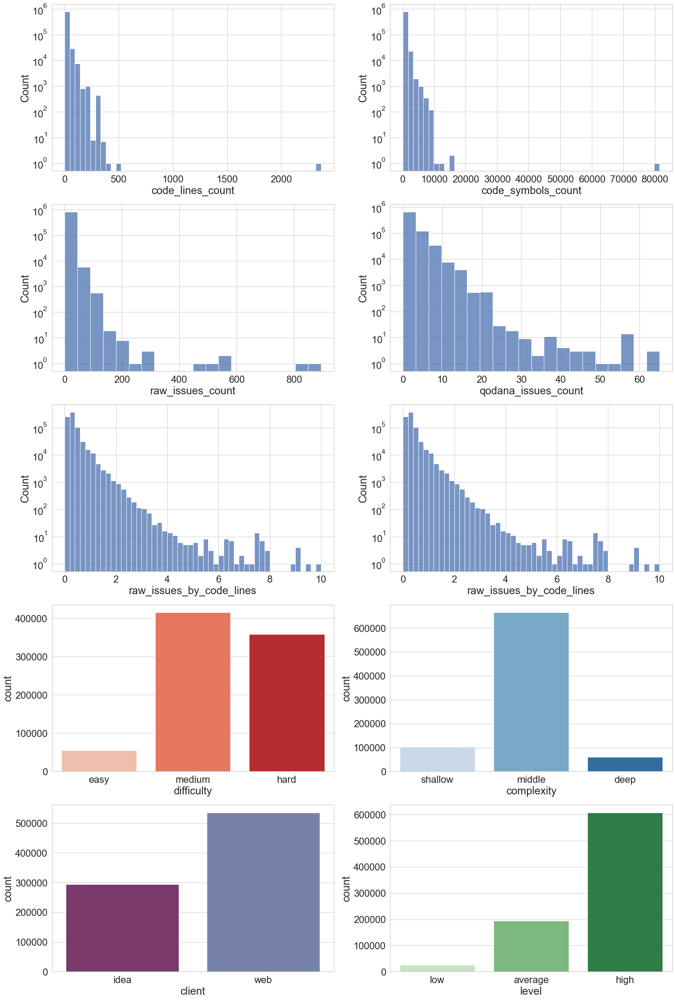

In [163]:
fig, ax = plt.subplots(figsize=((25, 40)), ncols=2, nrows=5)

sns.histplot(data=df_first_attempt_stats, x='code_lines_count', ax=ax[0][0], log_scale=(False, True), bins=50)
sns.histplot(data=df_first_attempt_stats, x='code_symbols_count', ax=ax[0][1], log_scale=(False, True), bins=50)
sns.histplot(data=df_first_attempt_stats, x='raw_issues_count', ax=ax[1][0], log_scale=(False, True), bins=20)
sns.histplot(data=df_first_attempt_stats, x='qodana_issues_count', ax=ax[1][1], log_scale=(False, True), bins=20)

sns.histplot(data=df_first_attempt_stats, x='raw_issues_by_code_lines', ax=ax[2][0], log_scale=(False, True), bins=50)
sns.histplot(data=df_first_attempt_stats, x='raw_issues_by_code_lines', ax=ax[2][1], log_scale=(False, True), bins=50)

sns.countplot(data=df_first_attempt_stats, x='difficulty', ax=ax[3][0], order=difficulty, palette=difficulty_palette)
sns.countplot(data=df_first_attempt_stats, x='complexity', ax=ax[3][1], order=complexity, palette=complexity_palette)
sns.countplot(data=df_first_attempt_stats, x='level', ax=ax[4][1], order=level, palette=level_palette)
sns.countplot(data=df_first_attempt_stats, x='client', ax=ax[4][0], order=client, palette=client_palette)


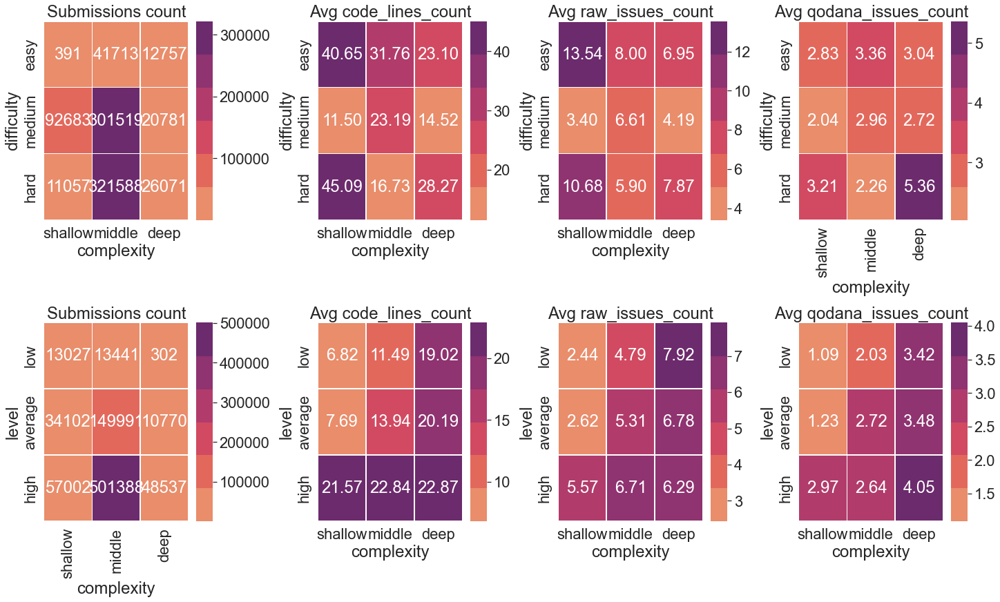

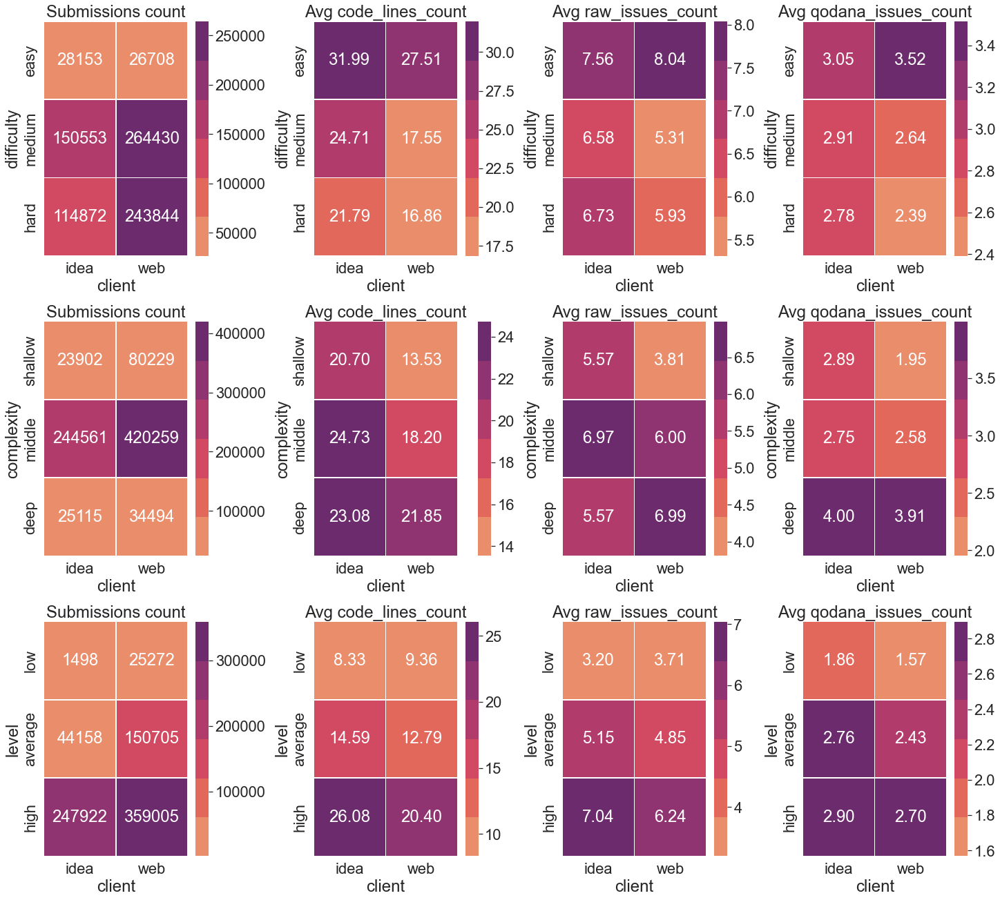

In [164]:
draw_heatmap_compare(df_first_attempt_stats, 
                     [(('difficulty', difficulty), ('complexity', complexity)), 
                      (('level', level), ('complexity', complexity))],
                     ['id', 'code_lines_count', 'raw_issues_count', 'qodana_issues_count'])
draw_heatmap_compare(df_first_attempt_stats,
                     [(('difficulty', difficulty), ('client', client)), 
                      (('complexity', complexity), ('client', client)),
                      (('level', level), ('client', client))],
                     ['id', 'code_lines_count', 'raw_issues_count', 'qodana_issues_count'])

In [165]:
df_first_attempt_raw_issues_stats = merge_dfs(df_first_attempt_stats, df_raw_issues_stats, left_on='id', right_on='id')
df_first_attempt_raw_issues_stats_unique = merge_dfs(df_first_attempt_stats, df_raw_issues_stats_unique, left_on='id', right_on='id')


In [166]:
df_first_attempt_qodana_issues_stats = merge_dfs(df_first_attempt_stats, df_qodana_issues_stats, left_on='id', right_on='id')
df_first_attempt_qodana_issues_stats_unique = merge_dfs(df_first_attempt_stats, df_qodana_issues_stats_unique, left_on='id', right_on='id')


## Percent of submissions with each issue class (first attempt)

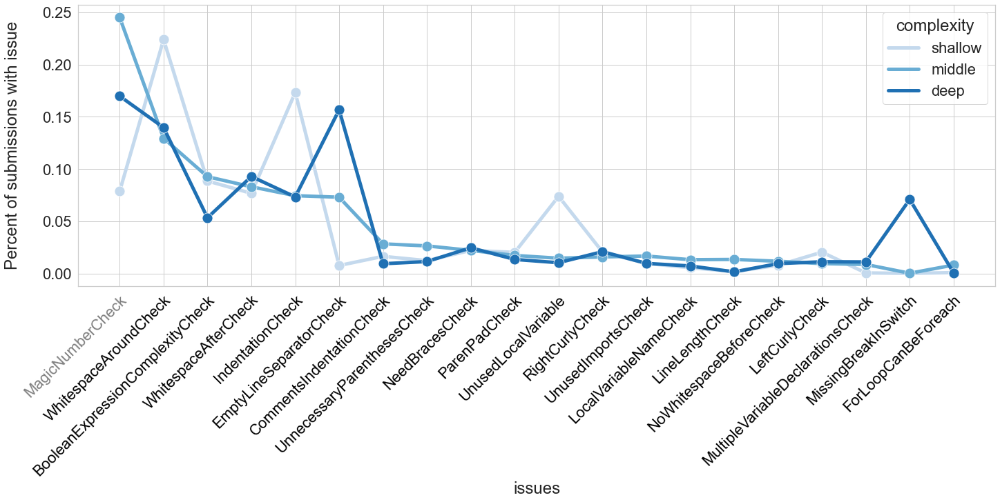

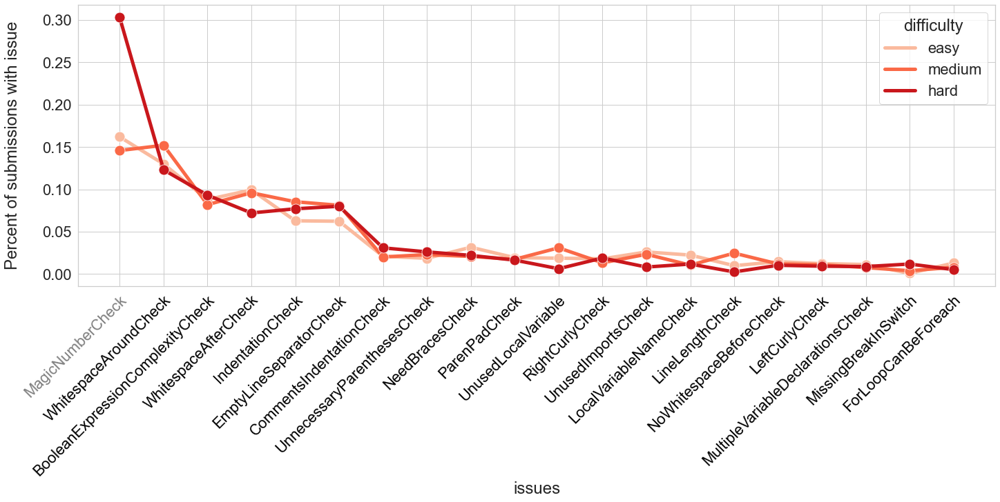

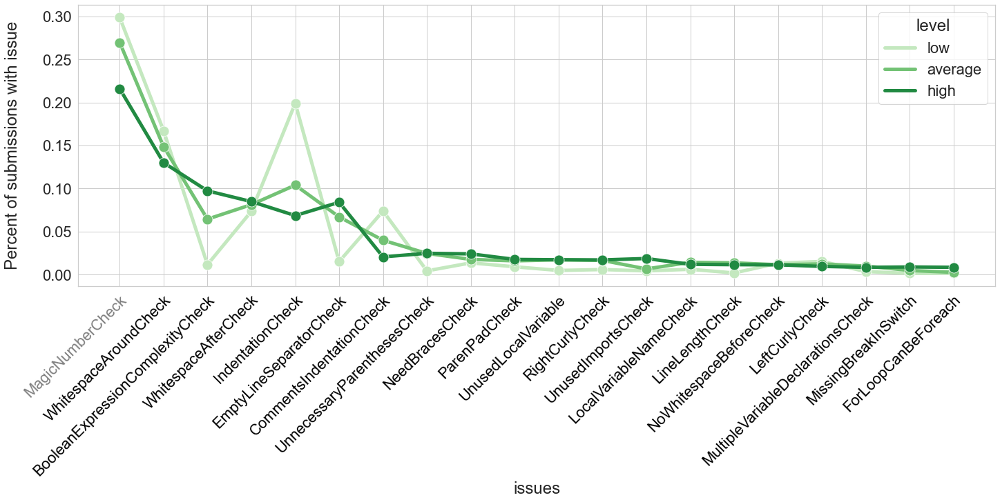

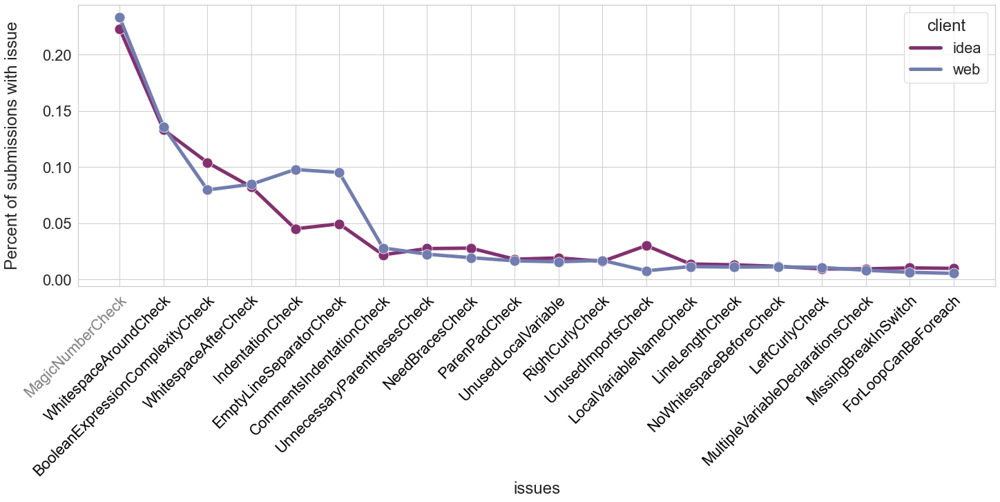

In [167]:
draw_compare_issues(df_first_attempt_raw_issues_stats_unique, attrs, raw_issues, by_type=False, percent=True)
# draw_compare_issues(df_first_attempt_stats_unique, attrs, raw_issues, by_type=True, percent=True)

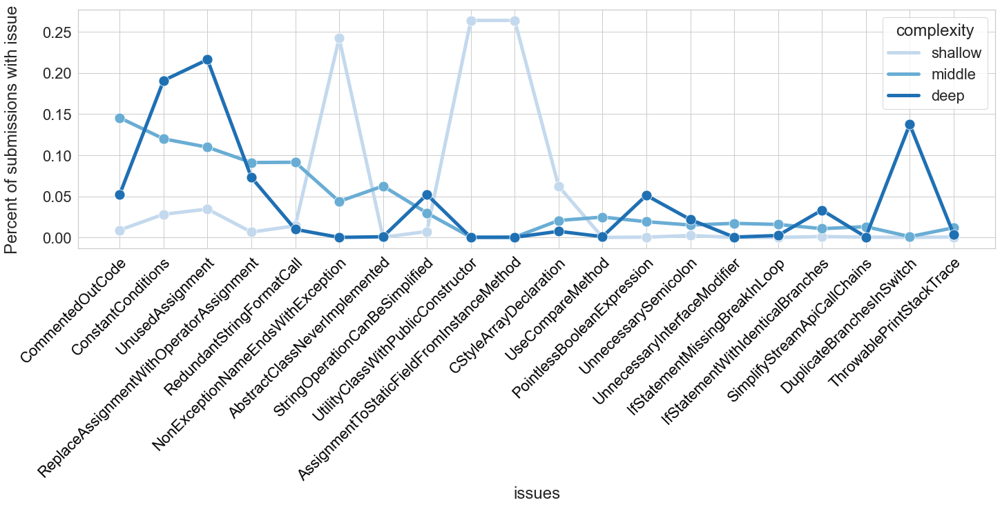

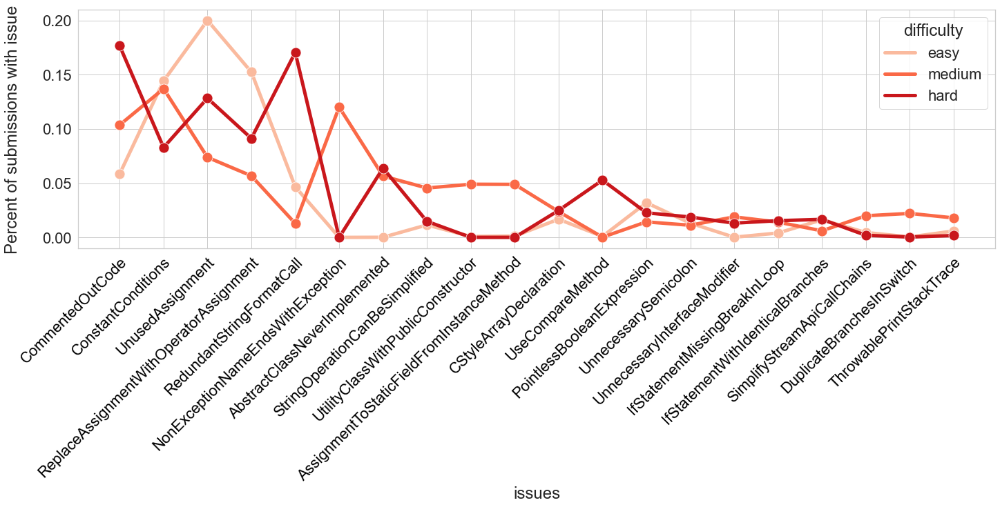

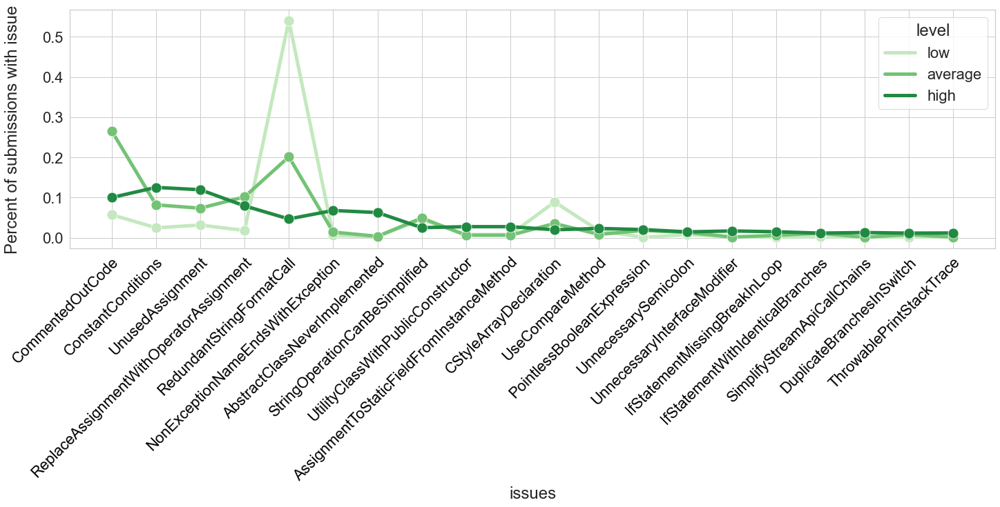

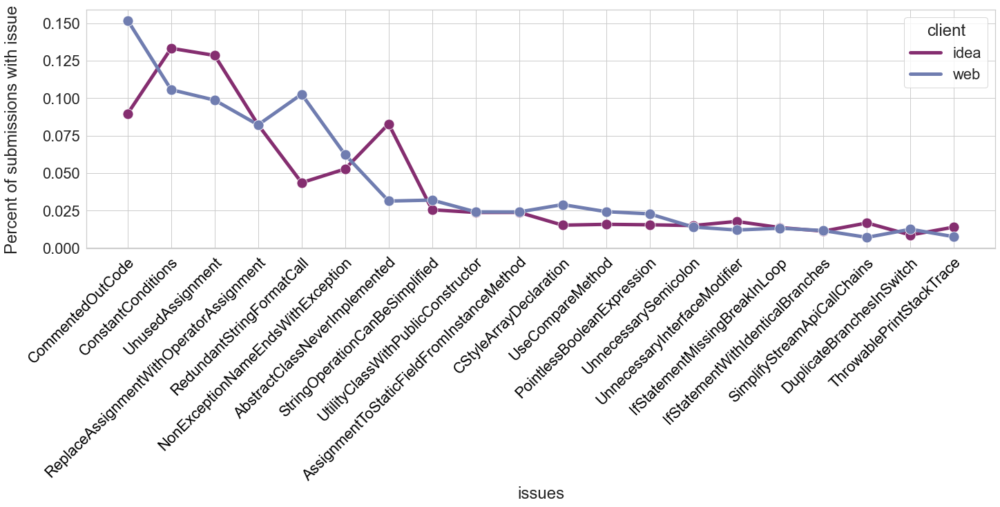

In [168]:
draw_compare_issues(df_first_attempt_qodana_issues_stats_unique, attrs, qodana_issues, by_type=False, percent=True)
# draw_compare_issues(df_first_attempt_qodana_issues_stats_unique, attrs, qodana_issues, by_type=True, percent=True)

# Last attempt stats

Last attempt submissions is when **attempt** == **total_attemps** - final result of all attemps

In [170]:
df_last_attempt_stats = df_submissions_stats[df_submissions_stats['attempt'] == df_submissions_stats['total_attempts']]
df_last_attempt_stats.describe()

,id,code_lines_count,code_symbols_count,qodana_issues_count,raw_issues_count,step_id,sync_counter,user_id,group,attempt,total_attempts,raw_issues_by_code_lines,qodana_issues_by_code_lines
count,8.285600e+05,828560.000000,828560.000000,828560.000000,828560.000000,828560.000000,828560.000000,828560.000000,8.285600e+05,828560.000000,828560.000000,828560.000000,828560.000000
mean,4.274326e+07,19.981348,515.201616,2.650877,5.578300,3566.038964,8.395184,8588.296581,5.519064e+05,1.286061,1.286061,0.296719,0.158778
std,7.900050e+06,19.551124,512.105045,2.088701,7.757915,2402.889875,1.626948,8039.852387,3.084101e+05,0.674301,0.674301,0.249193,0.098043
min,2.938134e+07,1.000000,91.000000,0.000000,0.000000,1926.000000,2.000000,0.000000,0.000000e+00,1.000000,1.000000,0.000000,0.000000
25%,3.574470e+07,11.000000,248.000000,1.000000,2.000000,2272.000000,7.000000,2357.000000,2.784538e+05,1.000000,1.000000,0.161290,0.096774
50%,4.265617e+07,15.000000,396.000000,2.000000,3.000000,2509.000000,8.000000,5893.000000,5.739165e+05,1.000000,1.000000,0.242991,0.142857
75%,4.977634e+07,22.000000,598.000000,3.000000,6.000000,3752.000000,9.000000,13222.000000,8.246342e+05,1.000000,1.000000,0.333333,0.181818
max,5.639778e+07,2367.000000,81399.000000,65.000000,893.000000,15239.000000,22.000000,82397.000000,1.055200e+06,5.000000,5.000000,39.000000,3.000000


<AxesSubplot:xlabel='level', ylabel='count'>

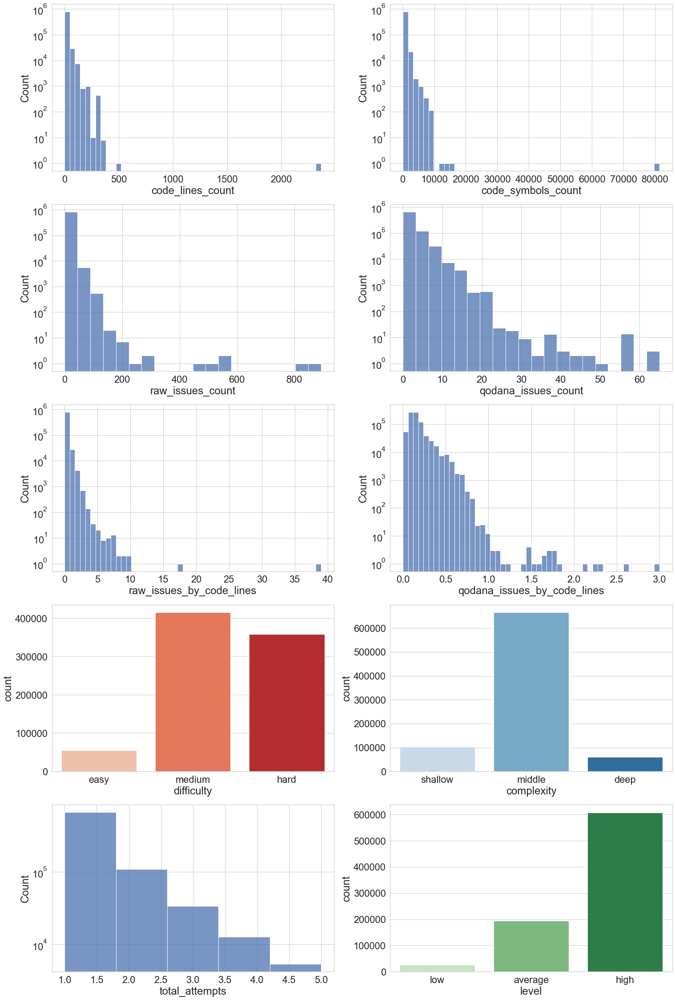

In [171]:
fig, ax = plt.subplots(figsize=((25, 40)), ncols=2, nrows=5)

sns.histplot(data=df_last_attempt_stats, x='code_lines_count', ax=ax[0][0], log_scale=(False, True), bins=50)
sns.histplot(data=df_last_attempt_stats, x='code_symbols_count', ax=ax[0][1], log_scale=(False, True), bins=50)
sns.histplot(data=df_last_attempt_stats, x='raw_issues_count', ax=ax[1][0], log_scale=(False, True), bins=20)
sns.histplot(data=df_last_attempt_stats, x='qodana_issues_count', ax=ax[1][1], log_scale=(False, True), bins=20)

sns.histplot(data=df_last_attempt_stats, x='raw_issues_by_code_lines', ax=ax[2][0], log_scale=(False, True), bins=50)
sns.histplot(data=df_last_attempt_stats, x='qodana_issues_by_code_lines', ax=ax[2][1], log_scale=(False, True), bins=50)
sns.countplot(data=df_last_attempt_stats, x='difficulty', ax=ax[3][0], order=difficulty, palette=difficulty_palette)
sns.countplot(data=df_last_attempt_stats, x='complexity', ax=ax[3][1], order=complexity, palette=complexity_palette)
sns.histplot(data=df_last_attempt_stats, x='total_attempts', ax=ax[4][0], log_scale=(False, True), bins=5)
sns.countplot(data=df_last_attempt_stats, x='level', ax=ax[4][1], order=level, palette=level_palette)

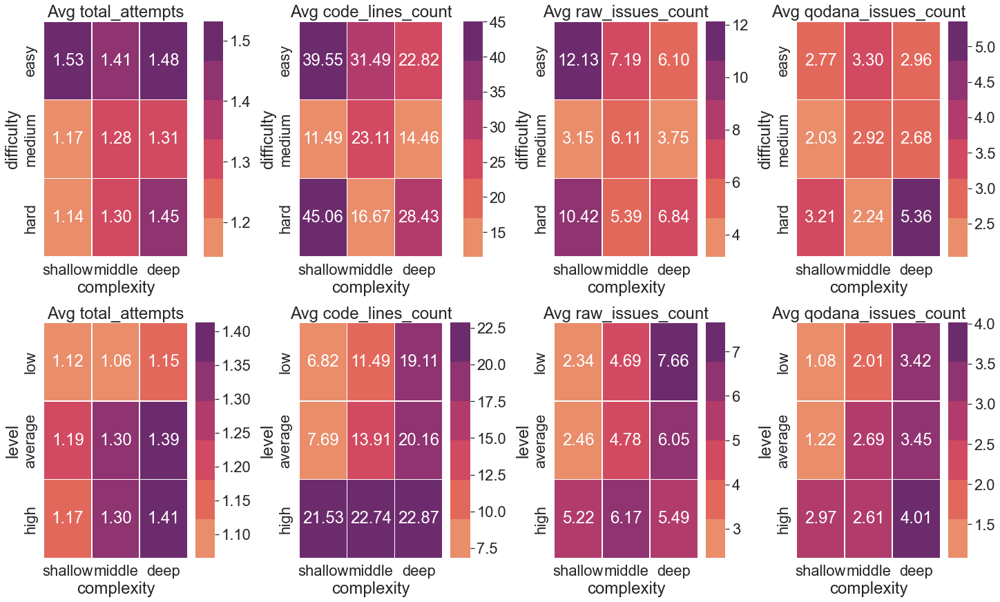

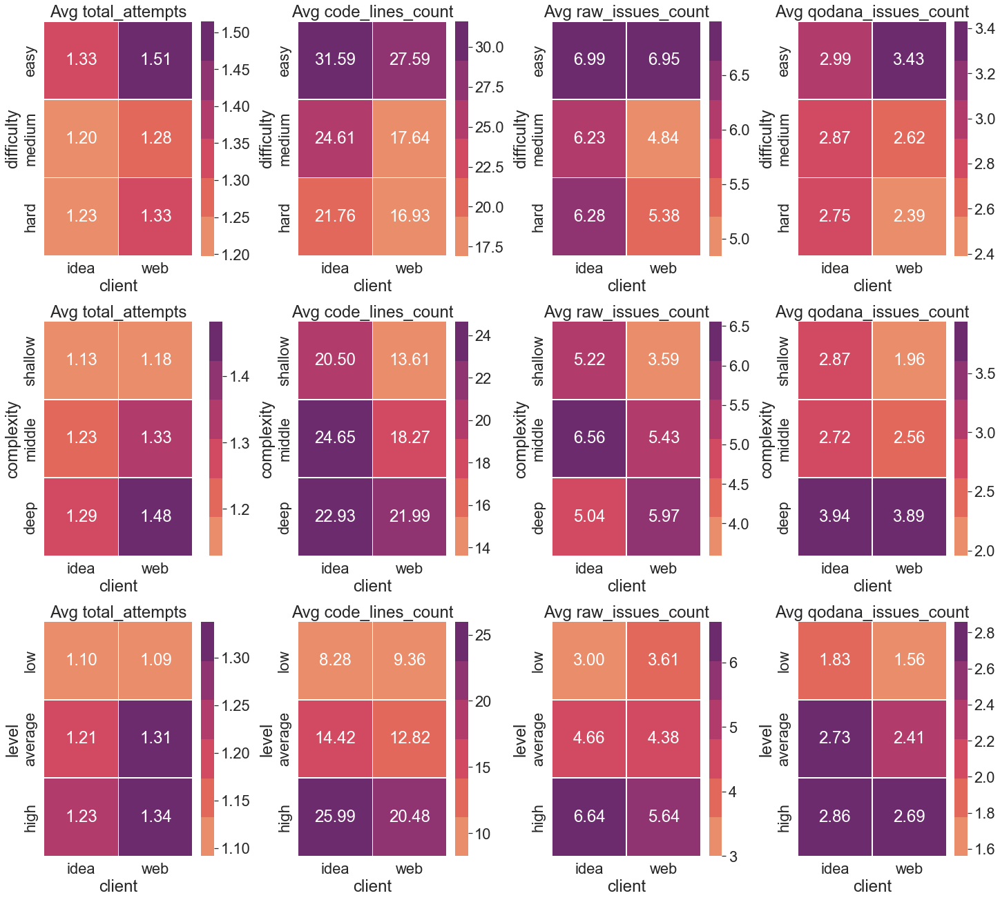

In [172]:
draw_heatmap_compare(df_last_attempt_stats, 
                     [(('difficulty', difficulty), ('complexity', complexity)), 
                      (('level', level), ('complexity', complexity))],
                     ['total_attempts', 'code_lines_count', 'raw_issues_count', 'qodana_issues_count'])
draw_heatmap_compare(df_last_attempt_stats,
                     [(('difficulty', difficulty), ('client', client)), 
                      (('complexity', complexity), ('client', client)),
                      (('level', level), ('client', client))],
                     ['total_attempts', 'code_lines_count', 'raw_issues_count', 'qodana_issues_count'])

In [173]:
df_last_attempt_raw_issues_stats = merge_dfs(df_last_attempt_stats, df_raw_issues_stats, left_on='id', right_on='id')
df_last_attempt_raw_issues_stats_unique = merge_dfs(df_last_attempt_stats, df_raw_issues_stats_unique, left_on='id', right_on='id')

In [174]:
df_last_attempt_qodana_issues_stats = merge_dfs(df_last_attempt_stats, df_qodana_issues_stats, left_on='id', right_on='id')
df_last_attempt_qodana_issues_stats_unique = merge_dfs(df_last_attempt_stats, df_qodana_issues_stats_unique, left_on='id', right_on='id')

## Percent of submissions with each issue class (last attempt)

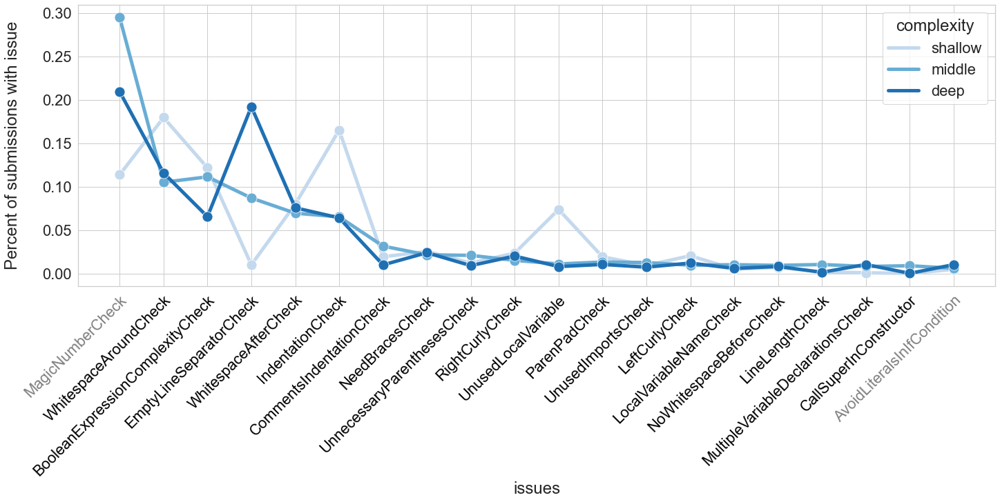

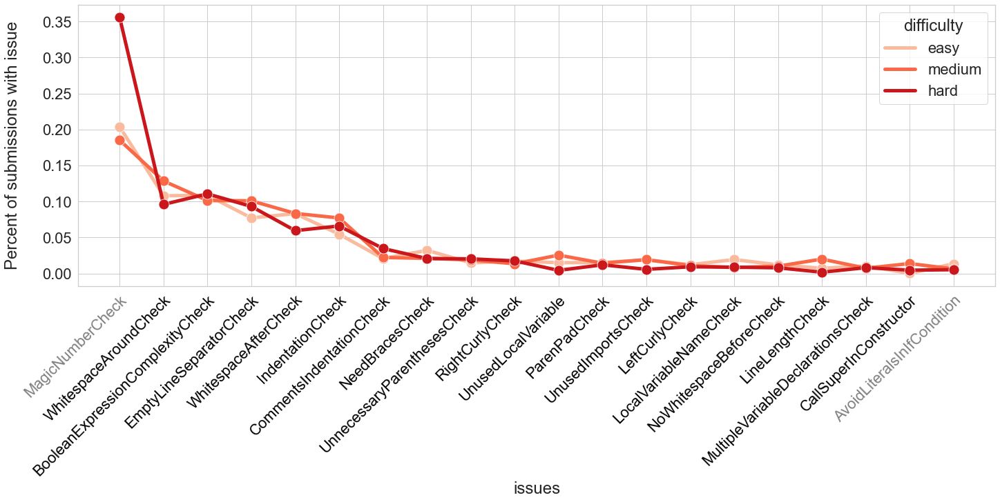

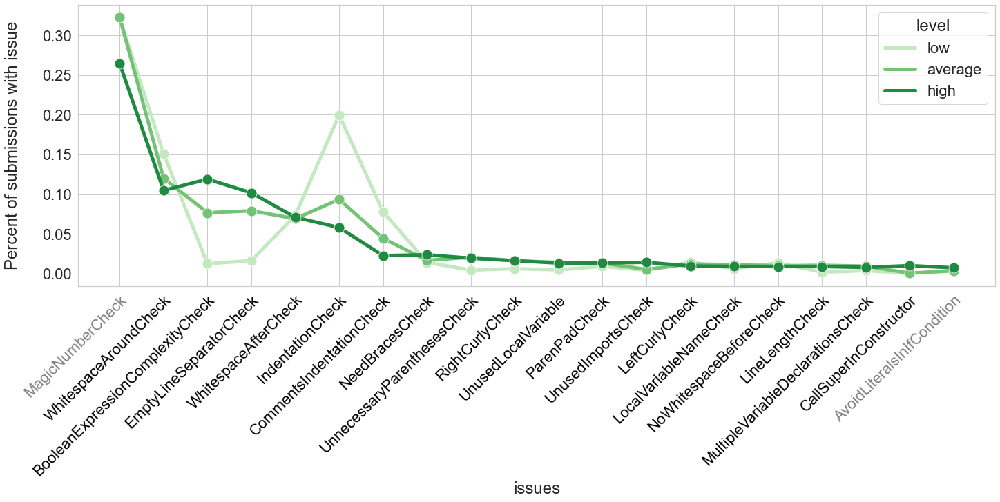

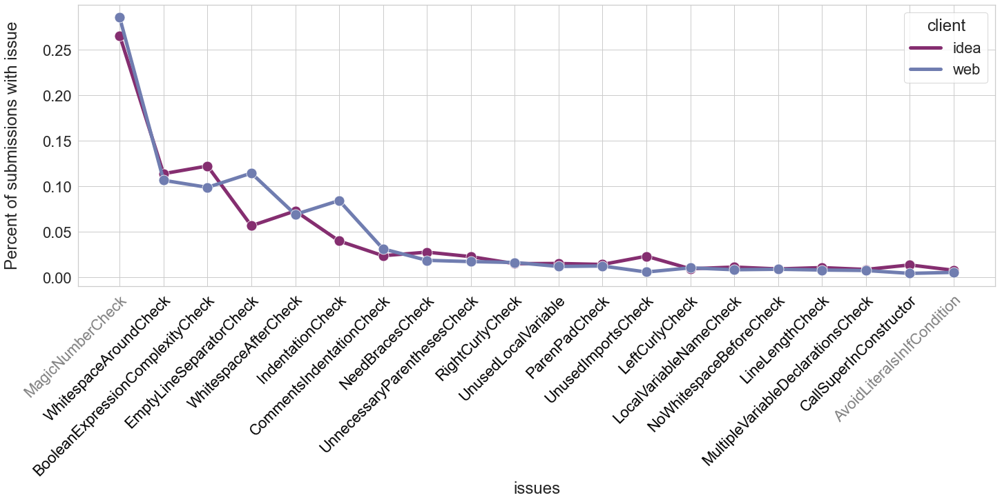

In [175]:
draw_compare_issues(df_last_attempt_raw_issues_stats_unique, attrs, raw_issues, by_type=False, percent=True)
# draw_compare_issues(df_last_attempt_stats_unique, attrs, raw_issues, by_type=True, percent=True)

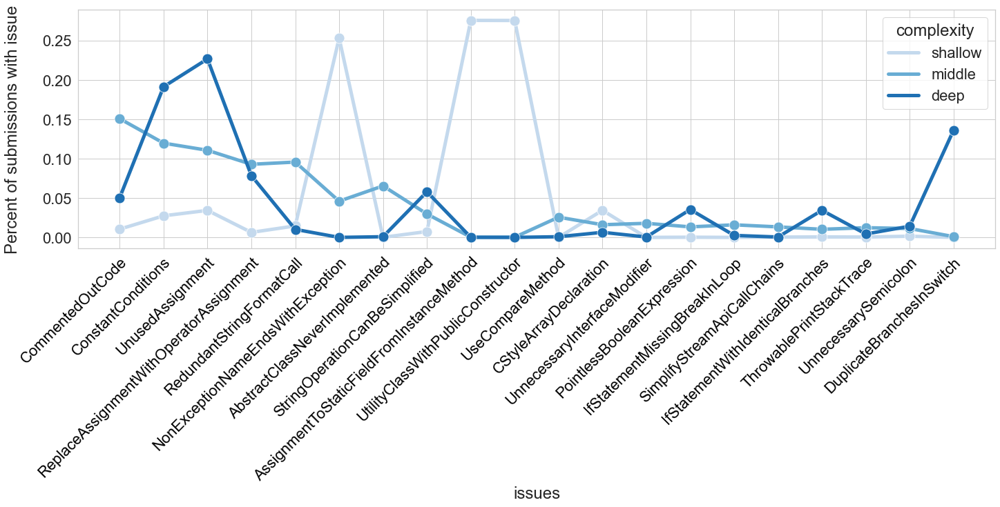

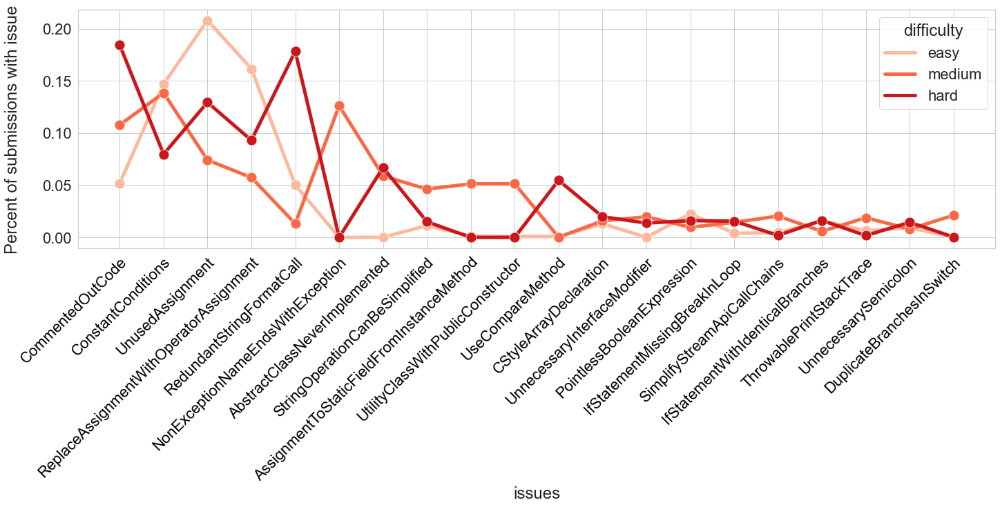

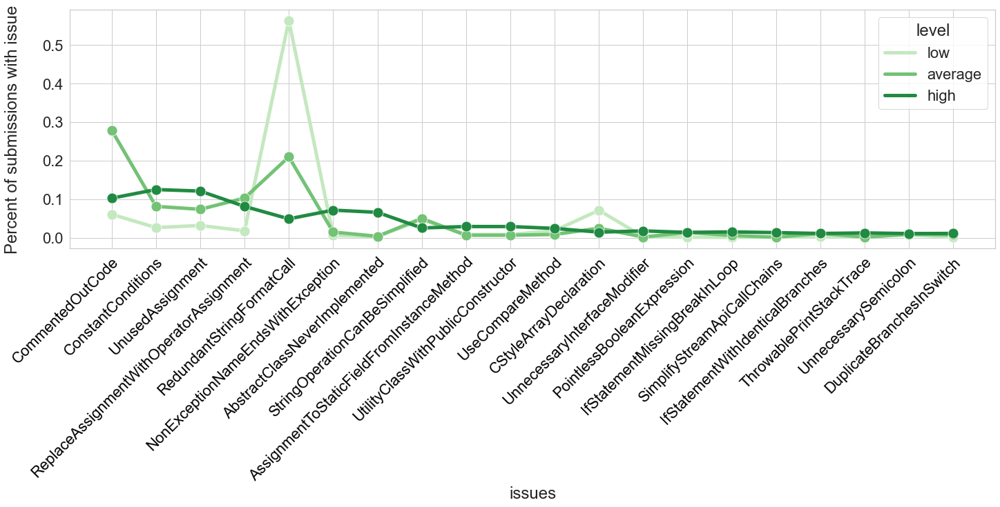

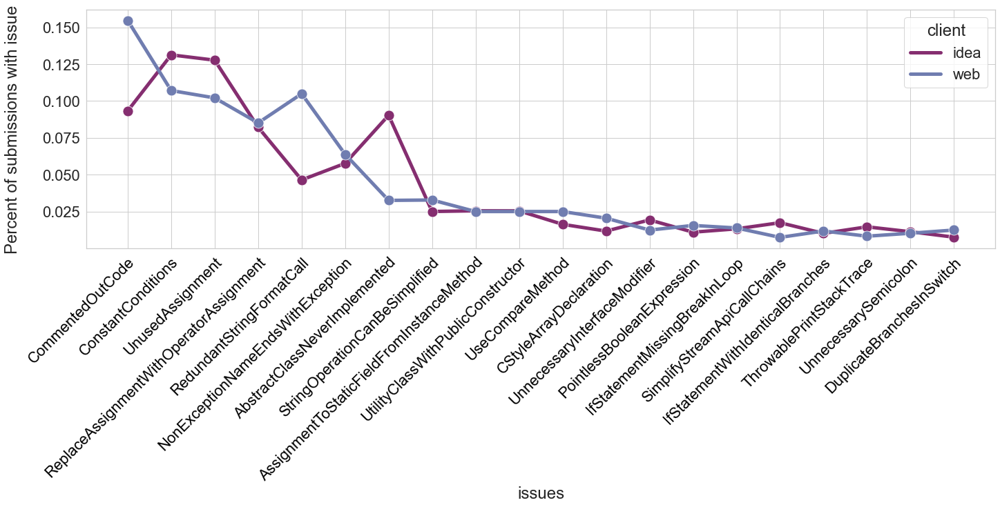

In [176]:
draw_compare_issues(df_last_attempt_qodana_issues_stats_unique, attrs, qodana_issues, by_type=False, percent=True)
# draw_compare_issues(df_last_attempt_stats_unique, attrs, raw_issues, by_type=True, percent=True)

## Client statistics

In [178]:
df_client_stats = pd.read_csv(client_stats_file_path)
df_client_stats['client_series'] = df_client_stats['client']

In [179]:
df_last_attempt_stats = merge_dfs(df_last_attempt_stats, df_client_stats, left_on='group', right_on='group')

In [180]:
def draw_client_dynamic(attemps: int):
    sns.set_theme(style='whitegrid', font_scale=2, rc={"lines.linewidth": 5, "lines.markersize": 10})
    fig, ax = plt.subplots(figsize=(20, 10), constrained_layout=True)
    plt.xticks(rotation=45, ha="right",rotation_mode='anchor')

    df = df_last_attempt_stats[df_last_attempt_stats['total_attempts'] == attemps]
    sns.countplot(data=df, ax=ax, x='client_series', order=df['client_series'].value_counts(ascending=False).index, color='grey')
    ax.set_yscale("log")

In [197]:
import ast

client_stats = df_last_attempt_stats['client_series'].value_counts()
attepmt_clients = [{c_from: {c_to: 0 for c_to in client} for c_from in client} 
                   for _ in range(5)]

for key in client_stats.keys():
    client_chain = ast.literal_eval(key)
    for i in range(1, len(client_chain)):
        attepmt_clients[i - 1][client_chain[i - 1]][client_chain[i]] += client_stats[key] 
        
attepmt_clients_values = []
for i in range(5):
    for c_from in client:
        for c_to in client:
            attepmt_clients_values.append(attepmt_clients[i][c_from][c_to])
attepmt_clients_values = sorted(attepmt_clients_values)

In [198]:
def draw_graph(graph):
    fig, ax = plt.subplots(figsize=(15,5))
    pos = nx.get_node_attributes(G,'pos')
    width = [G[u][v]['width'] for u, v in graph.edges()]
    labels = nx.get_edge_attributes(graph, 'weight')
    nx.draw(graph, pos, with_labels=True, edge_color='black', font_color='white', node_size=1500, width=width)
    nx.draw_networkx_edge_labels(graph, pos, edge_labels=labels)

In [201]:
attepmt_client_dict = {"attempt": [], "from": [], "to": [], "count": []}
for i in range(5):
    for from_client in client:
        for to_client in client:
            attepmt_client_dict['attempt'].append(i + 1)
            attepmt_client_dict['from'].append(from_client)
            attepmt_client_dict['to'].append(to_client)
            attepmt_client_dict['count'].append(attepmt_clients[i][from_client][to_client])

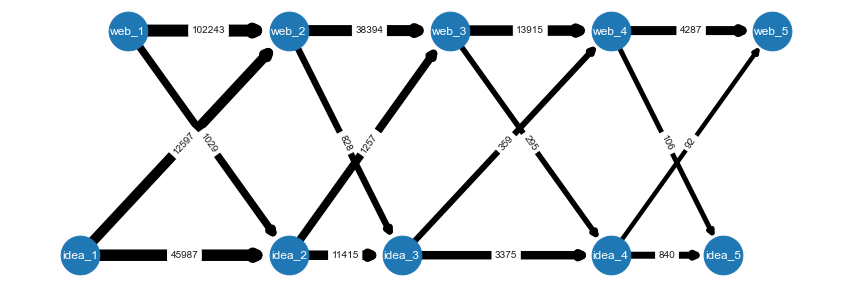

In [203]:
import networkx as nx
     
G = nx.DiGraph()

for i in range(5):
    for j, c in enumerate(client):
        G.add_node(f'{c}_{i + 1}', pos=(i + (0 if j % 2 == 0 and i % 2 == 0 else 0.3), j))

for i in range(4):
    for c_from in client:
        for c_to in client:
            weight = attepmt_clients[i][c_from][c_to]
            width = attepmt_clients_values.index(weight)
            G.add_edge(f'{c_from}_{i + 1}', f'{c_to}_{i + 2}', 
                       weight=weight,
                       width=(width + 5) / 2
                      )

draw_graph(G)

# Submission series (groups)
To pass the step user can make several attemps. The ordered sequence of attemps in **submission series**

In [204]:
from matplotlib.ticker import MaxNLocator

def get_submissions_series_dynamic(df: pd.DataFrame, features: List[str], is_mean=False):
    series_stats_dict = {
        'attempt': [],
        'count': [], 
    }
    for f in features:
        series_stats_dict[f] = []
        
    for attempt in df['attempt'].unique():
        df_a = df[df['attempt'] == attempt]
        series_stats_dict['attempt'].append(attempt)
        series_stats_dict['count'].append(df_a.shape[0])
        for f in features:
            series_stats_dict[f].append(df_a[f])
    if is_mean:
        for f in features:
            series_stats_dict[f] = list(map(np.mean, series_stats_dict[f]))
    else:
        for f in features:
            series_stats_dict[f] = list(map(np.median, series_stats_dict[f]))
    return pd.DataFrame.from_dict(series_stats_dict)

def draw_submissions_series_dynamic(df: pd.DataFrame, attrs, features, max_attemps: int = 10, is_eq=False, is_mean=False):
    if not is_eq:
        df = df[df['total_attempts'] <= max_attemps].copy()
    else:
        df = df[df['total_attempts'] == max_attemps].copy()

    for attr, values, palette in attrs:
        sns.set_theme(style='whitegrid', font_scale=2, rc={"lines.linewidth": 5, "lines.markersize": 15})
        fig, ax = plt.subplots(figsize=((20, 6 * len(features))), nrows=len(features), constrained_layout=True)
        for v in values:
            df_dynamic = get_submissions_series_dynamic(df[df[attr] == v], features, is_mean)
            df_dynamic.sort_values(['attempt'])

            for i, feature in enumerate(features):
                axi = ax if len(features) == 1 else ax[i]
                sns.lineplot(data=df_dynamic, x='attempt', y=feature, ax=axi, label=v, marker='o', color=palette[v])
                axi.set_title(f'Mean {feature} by attempt' if is_mean else f'Median {feature} by attempt')
                axi.xaxis.set_major_locator(MaxNLocator(integer=True))
        plt.show()

In [208]:
features = ['raw_issues_count', 'qodana_issues_count']
attemps = 5

### Submissions series dynamic
Plots show how average soution parameters change throught attemps 

### Dynamin for all sobmission series with total_attemps = n

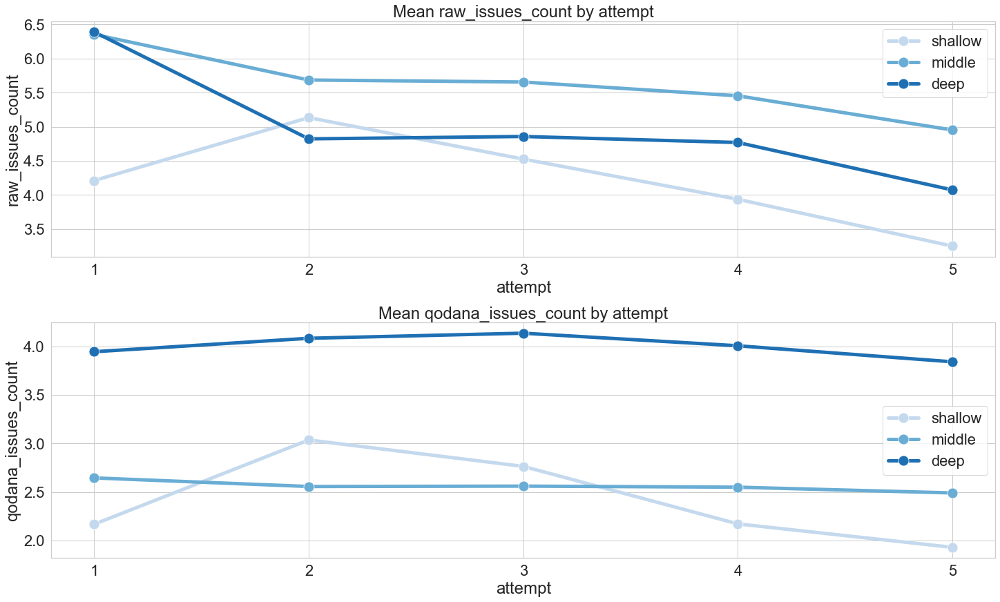

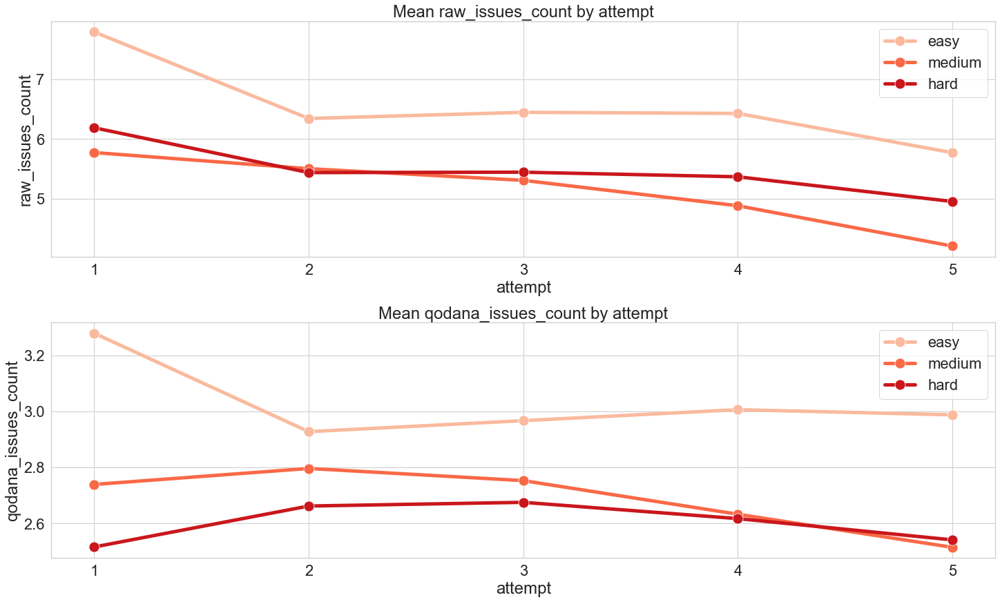

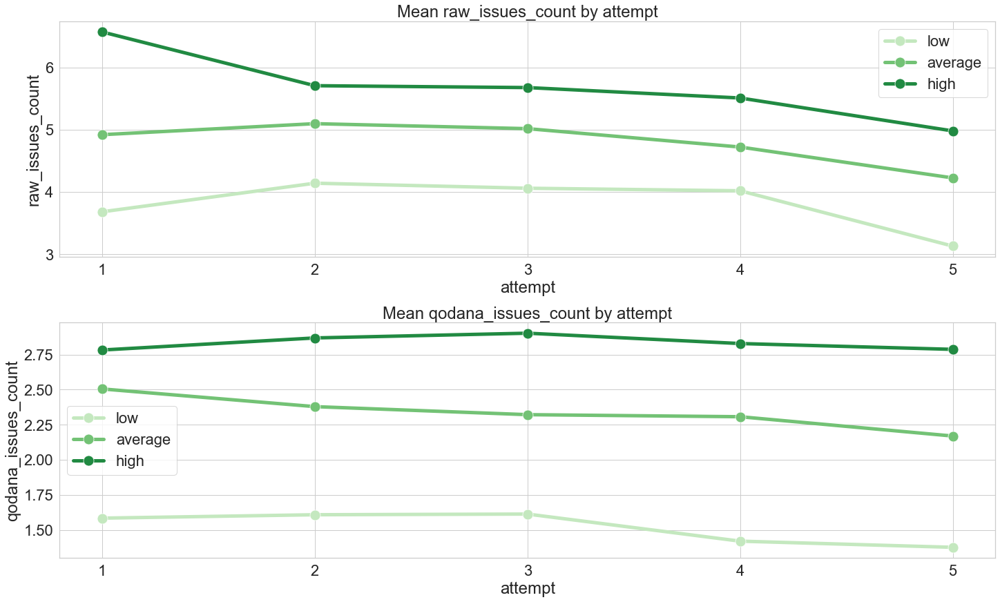

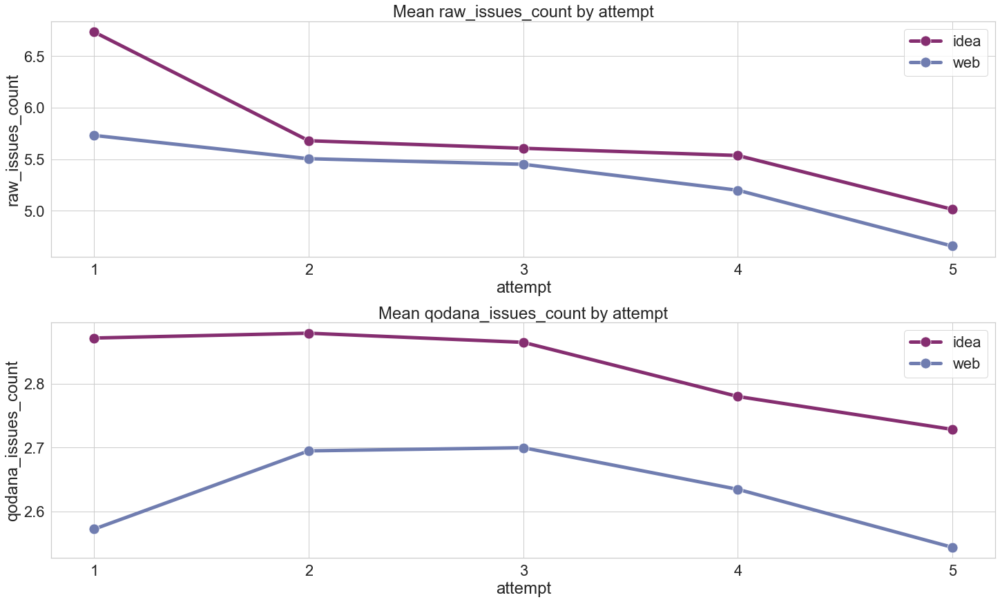

In [209]:
draw_submissions_series_dynamic(df_submissions_stats, attrs, features, attemps, is_eq=False, is_mean=True)

In [226]:
def get_submissions_issues_dynamic(df: pd.DataFrame, issues, by_type=True, is_mean=False):
    series_stats_dict = {
        'attempt': [],
        'count': [], 
    }
    for issues_class, issues_type in issues.items():
        series_stats_dict[issues_type if by_type else issues_class] = []
    for attempt in df['attempt'].unique():
        df_a = df[df['attempt'] == attempt]
        series_stats_dict['attempt'].append(attempt)
        series_stats_dict['count'].append(df_a.shape[0])
        if by_type:
            for issue_type in set(issues.values()):
                series_stats_dict[issue_type].append(np.zeros(df_a.shape[0]))
        else:
            for issue_class in set(issues.keys()):
                series_stats_dict[issue_class].append(np.zeros(df_a.shape[0]))
        for issues_class, issues_type in issues.items():
            series_stats_dict[issues_type if by_type else issues_class][-1] += df_a[issues_class]
    for issues_class, issues_type in issues.items():
        issue = issues_type if by_type else issues_class
        if is_mean:
            series_stats_dict[issue] = list(map(np.mean, series_stats_dict[issue]))
        else:
            series_stats_dict[issue] = list(map(np.median, series_stats_dict[issue]))
    return pd.DataFrame.from_dict(series_stats_dict)

def draw_submissions_issues_dynamic(df: pd.DataFrame, issues, max_attemps: int = 10, by_type=True, 
                                    is_eq=False, is_mean=False, bias=0.01):
    if not is_eq:
        df = df[df['total_attempts'] <= max_attemps].copy()
    else:
        df = df[df['total_attempts'] == max_attemps].copy()

    df_dynamic = get_submissions_issues_dynamic(df, issues, by_type, is_mean)
    fig, ax = plt.subplots(figsize=((20, 10)))
    sns.set_theme(style='whitegrid', font_scale=2, rc={"lines.linewidth": 5, "lines.markersize": 15})
    
    df_dynamic.to_csv('issues_dynamic_java.csv', index=False)
    issues = set(issues.values()) if by_type else set(issues.keys())
    
    for issue in issues:
        if (df_dynamic[issue] > bias).any():
            sns.lineplot(data=df_dynamic, x='attempt', y=issue, ax=ax, label=issue, marker='o')
    ax.set_title('Mean number of issues by attemps' if is_mean else 'Median number of issues by attemps')
    ax.set_ylabel('Number of issues')
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower center", bbox_to_anchor=[0.5, -0.15],
                       ncol=3, shadow=True, fancybox=True)
    if ax.get_legend() is not None:
        ax.get_legend().remove()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

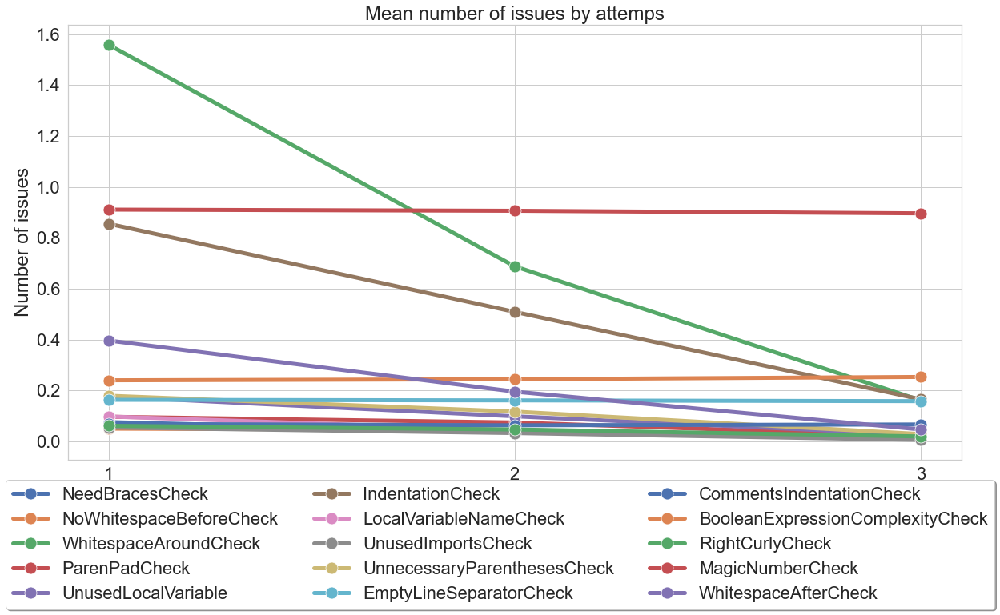

In [236]:
draw_submissions_issues_dynamic(df_raw_issues_stats, raw_issues, 3, 
                                by_type=False, is_eq=True, is_mean=True, bias=0.05)

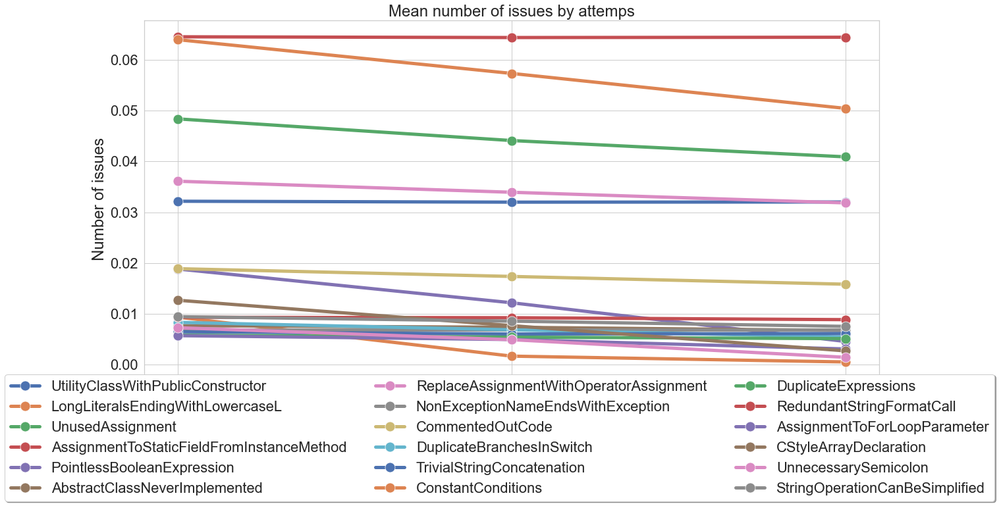

In [237]:
draw_submissions_issues_dynamic(df_qodana_issues_stats, qodana_issues, 3, 
                                by_type=False, is_eq=True, is_mean=True, bias=0.005)

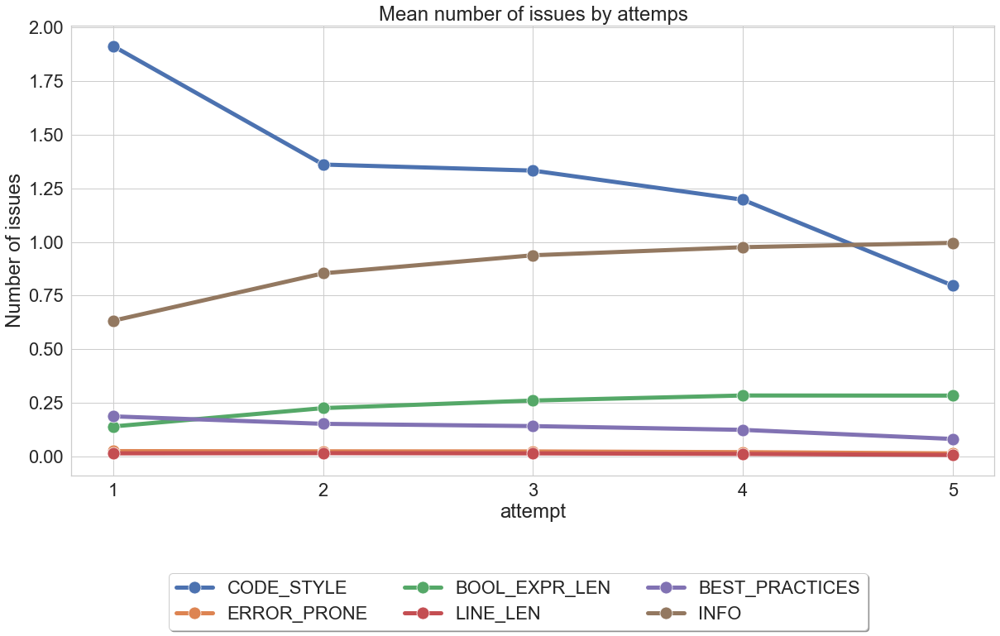

In [234]:
draw_submissions_issues_dynamic(df_raw_issues_stats, raw_issues, attemps, 
                                by_type=True, is_eq=False, is_mean=True)

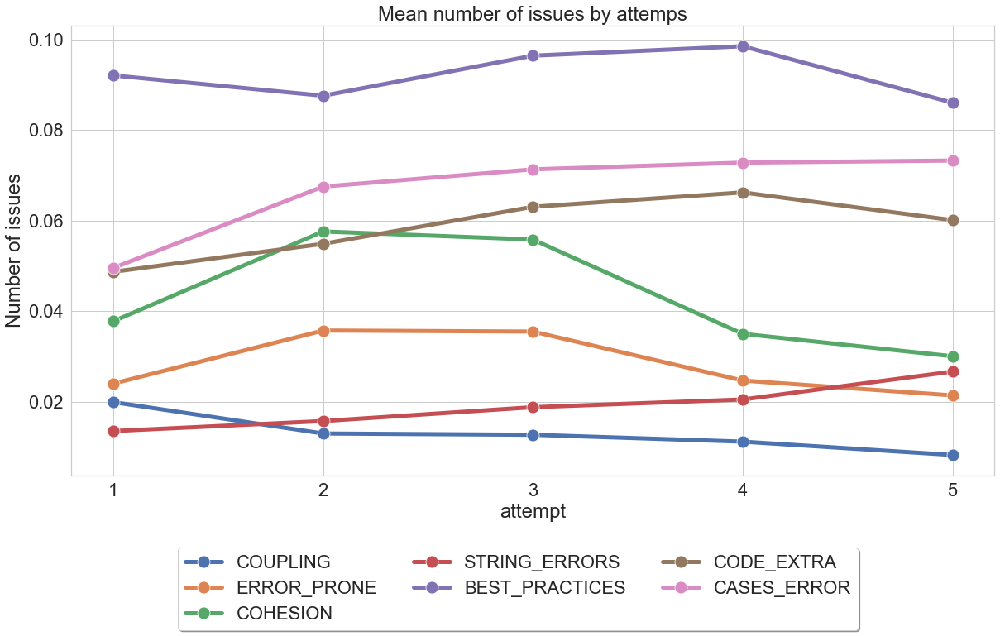

In [235]:
draw_submissions_issues_dynamic(df_qodana_issues_stats, qodana_issues, attemps, 
                                by_type=True, is_eq=False, is_mean=True)